In [ ]:
# ================================
# 0) GPU + INSTALLS
# ================================
!nvidia-smi -L || echo "No GPU found – training will be slow."
!pip -q install --upgrade ultralytics==8.3.34 matplotlib>=3.8 pyyaml opencv-python

import random, textwrap, glob
from pathlib import Path
import torch, yaml
import matplotlib.pyplot as plt

print("PyTorch:", torch.__version__, "| CUDA available:", torch.cuda.is_available())
device = "0" if torch.cuda.is_available() else "cpu"
random.seed(42)


GPU 0: Tesla T4 (UUID: GPU-11de5d16-045c-1201-fe71-ee6ff96a05d2)
PyTorch: 2.8.0+cu126 | CUDA available: True


In [ ]:
# ================================
# 1) MOUNT DRIVE + DATA PATHS
# ================================
from google.colab import drive
drive.mount('/content/drive')

# >>> EDIT ME if needed <<<
ROOT = "/content/drive/MyDrive/vegetation segmentation.v4i.yolov8"  # your dataset root

root = Path(ROOT)
assert root.exists(), f"Dataset root not found: {root}"

# Write a stable YAML (avoids ../ issues)
data_fixed = root / "data_fixed.yaml"
yaml_text = f'''
path: "{str(root)}"
train: train/images
val: valid/images
test: test/images
names: ["vegetation"]   # single-class segmentation
'''
data_fixed.write_text(textwrap.dedent(yaml_text).strip())
print("Wrote:", data_fixed)
print(data_fixed.read_text())

DATA_YAML = str(data_fixed)


Mounted at /content/drive
Wrote: /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/data_fixed.yaml
path: "/content/drive/MyDrive/vegetation segmentation.v4i.yolov8"
train: train/images
val: valid/images
test: test/images
names: ["vegetation"]   # single-class segmentation


In [ ]:
# ================================
# 2) SANITY CHECKS (counts + missing labels)
# ================================
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

def count_images(d):
    d = Path(d)
    return sum(1 for p in d.rglob("*") if p.suffix.lower() in exts) if d.exists() else 0

train_img_dir = root / "train" / "images"
val_img_dir   = root / "valid" / "images"
test_img_dir  = root / "test"  / "images"

print("Train images:", count_images(train_img_dir))
print("Val   images:", count_images(val_img_dir))
print("Test  images:", count_images(test_img_dir))

# list images and check labels exist
train_imgs = sorted([p for p in train_img_dir.rglob("*") if p.suffix.lower() in exts])
val_imgs   = sorted([p for p in val_img_dir.rglob("*")   if p.suffix.lower() in exts])

def lbl_for(img_path: Path) -> Path:
    return (img_path.parent.parent / "labels" / img_path.name).with_suffix(".txt")

missing = [str(p) for p in (train_imgs + val_imgs) if not lbl_for(p).exists()]
print("Missing labels:", len(missing))
if missing[:8]:
    print("First few without labels:\n", "\n".join(missing[:8]))


Train images: 945
Val   images: 83
Test  images: 40
Missing labels: 0


In [ ]:
# ================================
# 2) SANITY CHECKS (counts + presence of labels)
# ================================
exts = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

def count_images(d: Path):
    return sum(1 for p in Path(d).rglob("*") if p.suffix.lower() in exts) if Path(d).exists() else 0

train_img_dir = root / "train" / "images"
val_img_dir   = root / "valid" / "images"
test_img_dir  = root / "test"  / "images"

print("Train images:", count_images(train_img_dir))
print("Val   images:", count_images(val_img_dir))
print("Test  images:", count_images(test_img_dir))

# Verify every image has a label file
def lbl_for(img_path: Path) -> Path:
    return (img_path.parent.parent / "labels" / img_path.name).with_suffix(".txt")

train_imgs = sorted([p for p in train_img_dir.rglob("*") if p.suffix.lower() in exts])
val_imgs   = sorted([p for p in val_img_dir.rglob("*")   if p.suffix.lower() in exts])

missing = [str(p) for p in (train_imgs + val_imgs) if not lbl_for(p).exists()]
print("Missing labels:", len(missing))
if missing[:8]:
    print("First few without labels:\n", "\n".join(missing[:8]))


Train images: 945
Val   images: 83
Test  images: 40
Missing labels: 0


In [ ]:
# ================================
# 3) LABEL VALIDATION (SEGMENTATION)
# Each line: cls x1 y1 x2 y2 ... (normalized [0,1], len>5)
# ================================
bad_lines = []
non_poly_lines = []
range_issues = []

train_lbl_dir = root / "train" / "labels"
sample_files = sorted(train_lbl_dir.glob("*.txt"))[:300]  # sample up to 300

for lp in sample_files:
    lines = [ln.strip() for ln in open(lp).read().splitlines() if ln.strip()]
    for i, line in enumerate(lines):
        parts = line.split()
        if len(parts) <= 5:
            non_poly_lines.append((str(lp), i+1, line))
            continue
        try:
            cls = int(float(parts[0]))
            nums = list(map(float, parts[1:]))
            if len(nums) % 2 != 0:
                nums = nums[:-1]  # drop last if odd
            xs = nums[0::2]; ys = nums[1::2]
            if not xs or not ys:
                bad_lines.append((str(lp), i+1, line)); continue
            if any(not (0.0 <= v <= 1.0) for v in xs+ys):
                range_issues.append((str(lp), i+1))
        except Exception:
            bad_lines.append((str(lp), i+1, line))

print(f"Files checked: {len(sample_files)}")
print(f"Non-polygon lines (<=5 vals): {len(non_poly_lines)}")
print(f"Range issues (coords outside [0,1]): {len(range_issues)}")
print(f"Parse/other issues: {len(bad_lines)}")


Files checked: 300
Non-polygon lines (<=5 vals): 0
Range issues (coords outside [0,1]): 0
Parse/other issues: 0


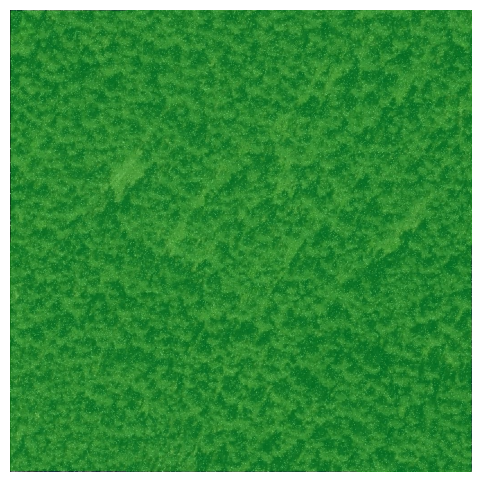

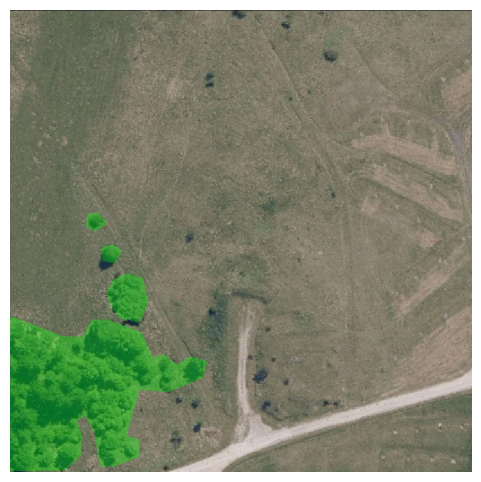

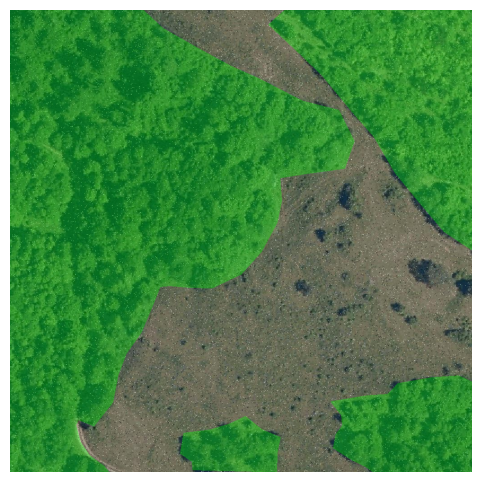

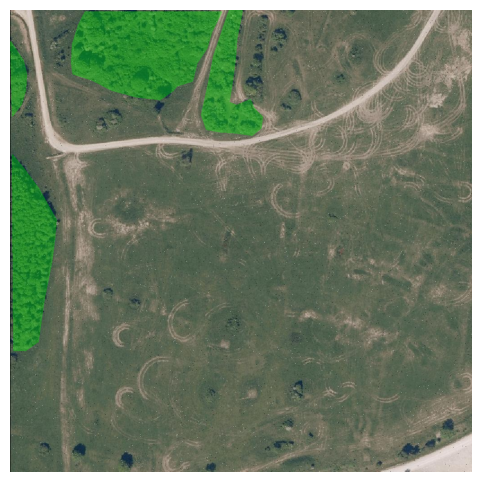

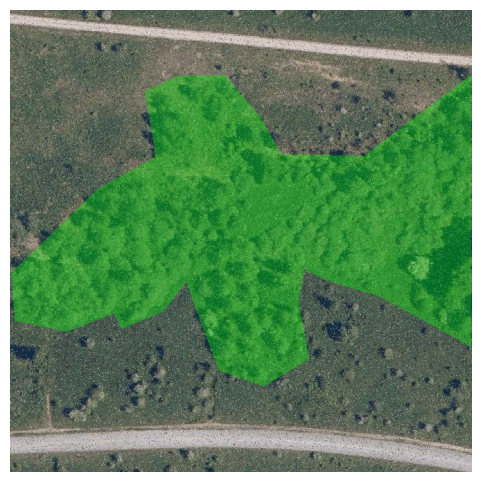

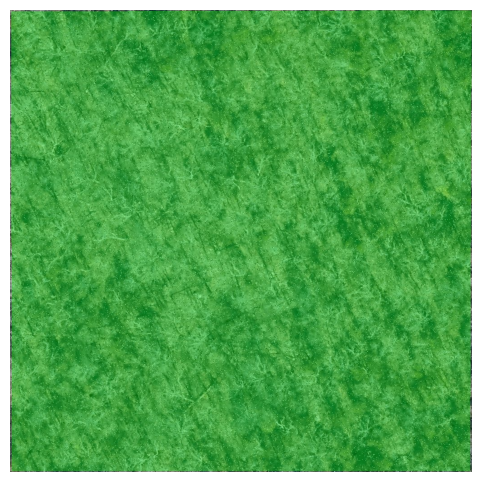

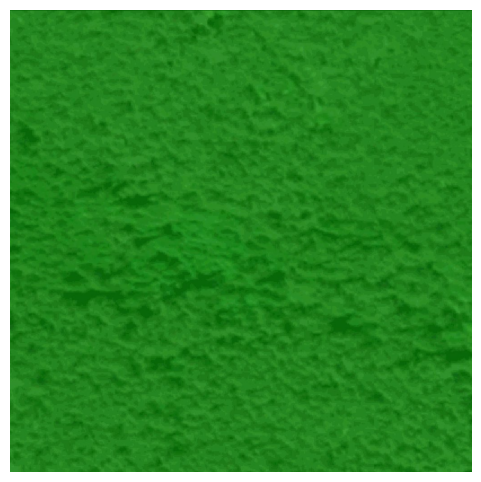

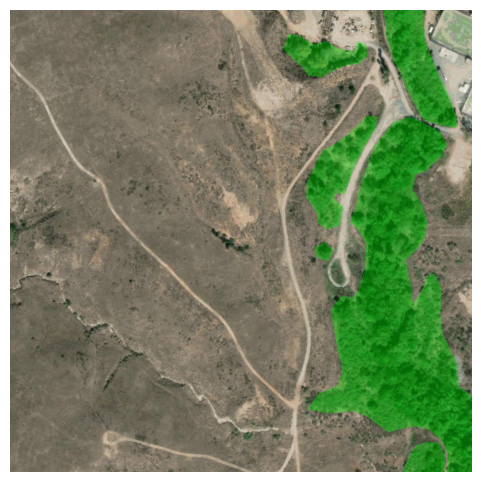

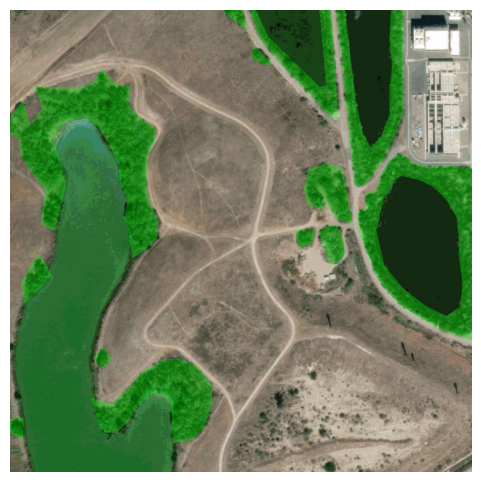

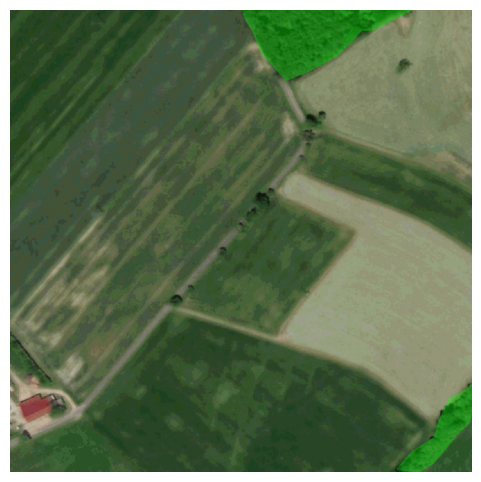

In [ ]:
# ================================
# 4) PREVIEW: DRAW SEGMENTATION MASKS BEFORE TRAINING
# ================================
import cv2, numpy as np

CLASS_NAMES = ["vegetation"]

def draw_polygons(im_bgr, polys, color=(0,255,0), alpha=0.35):
    overlay = im_bgr.copy()
    for poly in polys:
        if len(poly) >= 3:
            pts = np.array(poly, dtype=np.int32).reshape(-1,1,2)
            cv2.fillPoly(overlay, [pts], color)
            cv2.polylines(overlay, [pts], isClosed=True, color=color, thickness=2)
    return cv2.addWeighted(overlay, alpha, im_bgr, 1 - alpha, 0)

def show_masked(img_path: Path):
    im = cv2.imread(str(img_path))
    if im is None:
        print("Cannot read:", img_path); return
    H, W = im.shape[:2]
    lp = lbl_for(img_path)
    polys = []
    if lp.exists():
        for line in open(lp).read().strip().splitlines():
            parts = line.split()
            if len(parts) > 5:
                nums = list(map(float, parts[1:]))
                if len(nums) % 2 != 0: nums = nums[:-1]
                xs = (np.array(nums[0::2]) * W).clip(0, W-1)
                ys = (np.array(nums[1::2]) * H).clip(0, H-1)
                polys.append(np.stack([xs, ys], axis=1).tolist())
    im_show = draw_polygons(im, polys, color=(0,255,0), alpha=0.35)
    plt.figure(figsize=(6,6)); plt.imshow(cv2.cvtColor(im_show, cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.show()

# Show some train & val images
for p in random.sample(train_imgs, min(6, len(train_imgs))):
    show_masked(p)

for p in random.sample(val_imgs, min(4, len(val_imgs))):
    show_masked(p)


In [ ]:
# ================================
# 5) TRAIN YOLOv8 SEGMENTATION
# ================================
from ultralytics import YOLO

# Choose model size: n < s < m < l < x  (bigger = better but heavier)
MODEL_NAME = "yolov8s-seg.pt"   # try yolov8l-seg.pt if your GPU is strong (L4/A100)

TRAIN_CFG = dict(
    imgsz=896,          # 1024 if leaves are tiny and VRAM allows
    epochs=130,
    patience=30,
    batch=-1,           # auto batch
    device=device,
    optimizer="AdamW",
    lr0=0.003,
    lrf=0.1,
    weight_decay=5e-4,
    close_mosaic=10,    # turn off mosaic near end for spatial fidelity
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
    degrees=0.0, translate=0.08, scale=0.7, shear=0.0, perspective=0.0,
    flipud=0.0, fliplr=0.5,
    mosaic=1.0, mixup=0.15,
    box=7.5, cls=1.0, dfl=1.5,   # seg adds mask loss internally; these still help
    cache="ram",
    workers=8,
    project="runs", name="veg_yolov8m_seg",
)

model = YOLO(MODEL_NAME)
model.model.names = {0: "vegetation"}    # keep class name consistent
results = model.train(data=DATA_YAML, **TRAIN_CFG)
results


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 22.8M/22.8M [00:00<00:00, 179MB/s]


New https://pypi.org/project/ultralytics/8.3.222 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/drive/MyDrive/vegetation segmentation.v4i.yolov8/data_fixed.yaml, epochs=130, time=None, patience=30, batch=-1, imgsz=896, save=True, save_period=-1, cache=ram, device=0, workers=8, project=runs, name=veg_yolov8m_seg, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=Non

100%|██████████| 755k/755k [00:00<00:00, 28.3MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 104MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/train/labels... 945 images, 117 backgrounds, 0 corrupt: 100%|██████████| 945/945 [00:28<00:00, 32.75it/s] 


train: New cache created: /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/train/labels.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (2.1GB RAM): 100%|██████████| 945/945 [00:18<00:00, 51.93it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=896 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.15G reserved, 0.14G allocated, 14.44G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output


/usr/local/lib/python3.12/dist-packages/ultralytics/data/augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),


    11790483       78.74         0.629         66.68           nan        (1, 3, 896, 896)                    list
    11790483       157.5         1.537         38.27           nan        (2, 3, 896, 896)                    list
    11790483         315         2.944         71.48           nan        (4, 3, 896, 896)                    list
    11790483       629.9         5.704         109.2           nan        (8, 3, 896, 896)                    list
    11790483        1260        11.174         192.5           nan       (16, 3, 896, 896)                    list
AutoBatch: Using batch-size 12 for CUDA:0 8.73G/14.74G (59%) ✅


train: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/train/labels.cache... 945 images, 117 backgrounds, 0 corrupt: 100%|██████████| 945/945 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (2.1GB RAM): 100%|██████████| 945/945 [00:17<00:00, 54.44it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/valid/labels... 83 images, 10 backgrounds, 0 corrupt: 100%|██████████| 83/83 [01:18<00:00,  1.06it/s]

val: New cache created: /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/valid/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.2GB RAM): 100%|██████████| 83/83 [00:01<00:00, 71.93it/s]


Plotting labels to runs/veg_yolov8m_seg/labels.jpg... 
optimizer: AdamW(lr=0.003, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.00046875), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 896 train, 896 val
Using 2 dataloader workers
Logging results to runs/veg_yolov8m_seg
Starting training for 130 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/130      7.46G      1.504      3.338      3.955      1.715         80        896: 100%|██████████| 79/79 [00:50<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all         83        205     0.0901      0.234     0.0518     0.0177     0.0501      0.127      0.028    0.00705



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/130      7.31G      1.458      2.811       3.22      1.684         65        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all         83        205      0.224      0.195      0.115     0.0429      0.218       0.19     0.0985     0.0333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/130      7.44G       1.43      2.769      3.056      1.642         79        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all         83        205      0.109      0.166     0.0395      0.014     0.0976      0.117     0.0302    0.00968



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/130       7.3G      1.372       2.68      3.002      1.624         82        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all         83        205      0.113      0.229     0.0634     0.0223      0.116       0.22     0.0654     0.0184



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/130      7.35G      1.297      2.626      2.782      1.566         79        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all         83        205      0.376      0.483       0.37      0.165      0.369      0.439      0.338      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/130      7.81G      1.269      2.528      2.676      1.553         97        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all         83        205      0.324      0.376      0.273      0.131      0.338      0.385       0.28      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/130      7.41G      1.257      2.493      2.655       1.54         71        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all         83        205      0.311      0.448      0.308      0.151      0.325      0.454      0.317      0.148



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/130      7.41G      1.211       2.44      2.525      1.497         75        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all         83        205       0.41      0.415      0.372      0.176      0.407       0.42      0.346      0.163



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/130      7.26G       1.18      2.413       2.49      1.475         60        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all         83        205      0.401      0.537      0.404      0.202      0.552      0.449      0.416      0.188



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/130      7.46G      1.115      2.269      2.329      1.431        107        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all         83        205       0.47      0.488      0.428      0.223      0.498      0.478      0.419      0.199



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/130      7.51G      1.083      2.175      2.212      1.396        101        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all         83        205      0.583      0.502      0.534      0.267      0.573      0.502      0.514      0.234



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/130      7.46G      1.058      2.138      2.108      1.368         84        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all         83        205      0.657      0.493      0.515      0.244      0.612      0.498       0.49      0.215



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/130      7.49G       1.05      2.104      2.134      1.381         74        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all         83        205      0.503       0.58      0.503      0.265      0.581      0.498      0.496       0.25



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/130      7.34G       1.03       2.12      2.105      1.376         50        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all         83        205      0.591      0.493      0.498       0.25      0.593      0.512      0.512      0.228



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/130      7.62G     0.9875       2.01      1.939      1.328         76        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all         83        205      0.586      0.484      0.541      0.297       0.58      0.479      0.516      0.275



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/130      7.28G      1.001       1.98      1.919      1.331         96        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all         83        205      0.542      0.493      0.471      0.256      0.521      0.517      0.446       0.21



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/130      7.46G     0.9799      2.013      1.961      1.328         81        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all         83        205      0.594      0.486      0.529      0.269      0.667      0.444      0.521       0.24



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/130      7.22G     0.9321      1.926      1.851      1.287         92        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         83        205      0.529      0.527      0.507      0.271      0.578      0.546      0.524      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/130      7.35G     0.9233      1.912      1.815       1.28         92        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all         83        205      0.618      0.521      0.528      0.265      0.567      0.551      0.507      0.223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/130      7.39G     0.9422      1.947      1.826      1.293         99        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.21it/s]

                   all         83        205      0.584      0.483      0.495      0.266      0.555      0.468      0.456      0.223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/130      7.35G     0.9219      1.894      1.768      1.283         63        896: 100%|██████████| 79/79 [00:45<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all         83        205      0.603      0.493      0.532      0.266      0.614      0.493      0.528      0.251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/130      7.45G     0.8825      1.843      1.722      1.273         71        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         83        205      0.682      0.454      0.509      0.279      0.647      0.459      0.488      0.251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/130       7.4G     0.8737      1.848      1.704      1.254         76        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all         83        205      0.625      0.576       0.59      0.306      0.586      0.541      0.545       0.25



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/130      7.29G     0.9121      1.906      1.747      1.285         72        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all         83        205      0.601      0.576      0.552      0.295      0.608      0.567      0.538      0.277



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/130      7.42G     0.9319      1.952      1.806       1.29        108        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all         83        205      0.536      0.561      0.515      0.276      0.558      0.536      0.513      0.254



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/130      7.21G     0.8772      1.827      1.668      1.247        108        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all         83        205      0.623      0.551      0.523      0.291       0.65      0.576      0.556      0.271



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/130      7.27G      0.898      1.881      1.737      1.269         68        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all         83        205      0.643      0.498      0.538      0.293      0.606      0.468      0.495      0.257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/130      7.24G     0.8334      1.688      1.572      1.208         66        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all         83        205      0.595      0.551      0.559      0.305      0.593       0.56      0.544      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/130      7.48G     0.8336      1.742      1.594      1.213         99        896: 100%|██████████| 79/79 [00:45<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.70it/s]

                   all         83        205      0.527        0.6      0.572      0.328      0.669      0.512      0.586      0.278



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/130      7.43G     0.8201      1.712       1.57      1.217        126        896: 100%|██████████| 79/79 [00:45<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all         83        205      0.663      0.547      0.604      0.328      0.673      0.541      0.571      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/130      7.35G      0.823      1.746      1.545      1.215         75        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all         83        205      0.507      0.532      0.476      0.272       0.52      0.532      0.487      0.254



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/130       7.5G     0.7987      1.703      1.528      1.205        102        896: 100%|██████████| 79/79 [00:44<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all         83        205      0.592      0.585      0.556      0.308      0.628      0.546       0.56      0.286



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/130      7.48G     0.7949      1.642      1.486      1.193         95        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all         83        205      0.622      0.546      0.519      0.297      0.628      0.556      0.521      0.264



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/130      7.54G     0.8326      1.751      1.577      1.218         97        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all         83        205      0.594      0.561      0.527      0.286      0.602      0.554      0.528      0.256



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/130      7.43G     0.7829        1.6       1.45      1.186         74        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all         83        205      0.625      0.571      0.578      0.309      0.635      0.561      0.569      0.275



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/130      7.17G     0.7868      1.635      1.454       1.19         55        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all         83        205      0.578      0.582      0.553      0.321      0.585      0.551      0.541      0.279



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/130      7.11G     0.7968      1.737      1.519      1.211         70        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         83        205      0.692      0.593      0.627      0.363      0.693        0.6      0.626      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/130      7.25G     0.8086      1.691      1.509      1.207        117        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  2.00it/s]

                   all         83        205      0.619      0.527      0.572      0.317      0.616      0.547      0.555      0.293



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/130      7.49G     0.7569      1.561      1.412      1.167         73        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all         83        205      0.552      0.527      0.501      0.283      0.562      0.575       0.52      0.259



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/130      7.21G     0.7587      1.548      1.402      1.176         79        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all         83        205      0.545      0.585      0.556      0.309      0.557      0.585      0.559      0.267



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/130      7.79G     0.7389      1.518      1.366      1.157        114        896: 100%|██████████| 79/79 [00:43<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all         83        205      0.581       0.61      0.576      0.349      0.579      0.544      0.535      0.296



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/130      7.63G     0.7427      1.605      1.401      1.161         55        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all         83        205      0.651      0.537      0.566      0.305      0.641      0.522      0.523      0.259



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/130      7.12G     0.7697      1.669      1.435      1.191         53        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all         83        205      0.695      0.546      0.577      0.332      0.694      0.541      0.572      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/130      7.24G     0.7287       1.53      1.347       1.16         91        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         83        205      0.708      0.571      0.619      0.356       0.69      0.556      0.598      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/130      7.27G      0.732      1.552      1.348      1.158         73        896: 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all         83        205      0.529       0.58      0.525      0.306      0.552      0.576       0.54      0.285



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/130      7.16G     0.7308      1.529      1.337      1.143         89        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all         83        205      0.639      0.541       0.57      0.341      0.686      0.537      0.575      0.307



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/130      7.23G     0.7291      1.537      1.335      1.146         71        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all         83        205      0.627       0.55      0.612      0.356       0.63      0.546      0.586      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/130       7.4G     0.7264      1.537       1.32      1.145         94        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all         83        205      0.581        0.6      0.569      0.331      0.583      0.595      0.562      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/130      7.38G     0.7065      1.502      1.297      1.141        125        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]

                   all         83        205      0.749      0.532      0.606      0.357       0.74      0.528      0.609      0.323



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/130      7.45G     0.7058      1.494      1.292      1.142        151        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         83        205      0.619      0.605      0.623      0.338      0.619      0.605      0.591       0.31



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/130      7.25G     0.7198      1.517      1.311      1.147         82        896: 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all         83        205      0.723      0.598      0.652      0.388      0.731        0.6      0.658      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/130      7.57G     0.6856      1.425      1.235      1.118        116        896: 100%|██████████| 79/79 [00:45<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

                   all         83        205       0.67      0.624      0.587      0.324       0.68      0.634      0.611      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/130      7.29G     0.6892      1.456      1.244      1.123        102        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]

                   all         83        205      0.746      0.493      0.571      0.324      0.729      0.517      0.577      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/130      7.29G     0.7032      1.497      1.293      1.132         83        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all         83        205      0.615      0.556      0.555      0.315      0.624      0.561      0.551      0.283



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/130       7.7G     0.6966       1.47      1.264      1.136         95        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all         83        205       0.56      0.585      0.539      0.292      0.603      0.605      0.572      0.273



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/130      7.45G     0.6834       1.46      1.257      1.134         94        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all         83        205      0.669      0.571      0.619       0.35      0.669      0.571      0.609      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/130      7.45G     0.6923       1.49      1.278      1.136         39        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all         83        205      0.632       0.59      0.584      0.333      0.624      0.591      0.571      0.306



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/130      7.32G     0.6584      1.389      1.184      1.097         79        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         83        205       0.59      0.583      0.566      0.328      0.595      0.588      0.562      0.299



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/130      7.44G     0.6754      1.469      1.236      1.117         96        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all         83        205      0.722      0.566      0.615      0.361      0.702      0.556      0.591      0.315



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/130      7.32G     0.6733      1.455      1.267      1.121         78        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all         83        205      0.542      0.571      0.548      0.314      0.563      0.585      0.563      0.294



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/130       7.4G       0.66      1.424      1.217      1.108         95        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all         83        205      0.688      0.556        0.6      0.345      0.732      0.547      0.584      0.313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/130      7.38G     0.6583      1.366      1.184      1.101         71        896: 100%|██████████| 79/79 [00:45<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         83        205      0.642       0.59      0.603      0.352      0.643      0.571      0.586      0.306



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/130      7.39G     0.6577      1.392      1.194      1.101         99        896: 100%|██████████| 79/79 [00:45<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all         83        205      0.581      0.605      0.549      0.313      0.586       0.61      0.551      0.274



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/130      7.35G     0.6444      1.385      1.154      1.095        147        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all         83        205      0.653      0.623       0.62      0.354       0.64      0.617      0.624      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/130      7.43G     0.6555      1.403       1.16      1.103        181        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all         83        205      0.596      0.568      0.564      0.323      0.596      0.568      0.549      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/130      7.52G     0.6417      1.353      1.158      1.088        118        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all         83        205      0.664      0.578       0.58      0.358      0.664      0.578      0.566      0.295



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/130      7.36G     0.6371       1.35      1.137       1.09         94        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all         83        205      0.583      0.546      0.514      0.296      0.614      0.541      0.541      0.275



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/130      7.28G     0.6185      1.311      1.106      1.077        102        896: 100%|██████████| 79/79 [00:44<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

                   all         83        205      0.627      0.558      0.572      0.321      0.617      0.551      0.578      0.299



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/130      7.47G     0.6517      1.402       1.19      1.095         91        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]

                   all         83        205      0.617       0.61      0.582      0.308       0.63       0.61      0.577      0.287



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/130      7.21G     0.6458      1.387      1.176      1.098         94        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         83        205      0.611       0.58       0.55      0.315      0.633      0.548       0.55      0.278



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/130      7.53G     0.6378       1.41      1.154      1.098         87        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.44it/s]

                   all         83        205      0.653      0.585      0.595      0.352      0.682       0.58      0.601      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/130      7.58G      0.629      1.358      1.129      1.098        117        896: 100%|██████████| 79/79 [00:43<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]

                   all         83        205      0.623      0.576      0.576      0.335      0.633      0.571      0.563      0.309



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/130      7.47G     0.6238      1.328      1.105      1.083        102        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.21it/s]

                   all         83        205      0.646      0.556      0.552      0.328      0.644      0.546      0.543      0.287



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/130      7.37G     0.6398       1.41      1.149      1.094        108        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all         83        205      0.612      0.561      0.581       0.34      0.664       0.55      0.586      0.308



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/130      7.59G      0.621      1.349      1.122      1.084         82        896: 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]

                   all         83        205      0.646      0.576      0.579      0.323      0.635      0.566      0.572      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/130      7.48G     0.6025      1.274       1.06      1.066        187        896: 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         83        205      0.675       0.58      0.593      0.362      0.681      0.584      0.603      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/130      7.28G     0.5966      1.295      1.064      1.067        122        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all         83        205       0.71       0.58      0.616      0.367      0.712      0.567      0.608      0.329



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/130      7.56G     0.6181      1.342      1.115      1.079         83        896: 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all         83        205       0.63      0.585      0.605      0.369      0.642      0.595      0.601      0.322



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/130      7.42G     0.6001      1.282      1.064      1.072         51        896: 100%|██████████| 79/79 [00:44<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all         83        205      0.678      0.561      0.629      0.376      0.661      0.546      0.581      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/130      7.34G     0.5973      1.249      1.031      1.065        102        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]

                   all         83        205      0.615       0.58      0.599      0.351      0.608      0.566      0.561      0.302



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/130      7.32G     0.5975      1.271      1.061      1.073         83        896: 100%|██████████| 79/79 [00:44<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all         83        205      0.682        0.6      0.624      0.374      0.666      0.561      0.603      0.329
EarlyStopping: Training stopped early as no improvement observed in last 30 epochs. Best results observed at epoch 51, best model saved as best.pt.
To update EarlyStopping(patience=30) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



81 epochs completed in 1.140 hours.
Optimizer stripped from runs/veg_yolov8m_seg/weights/last.pt, 23.9MB
Optimizer stripped from runs/veg_yolov8m_seg/weights/best.pt, 23.9MB

Validating runs/veg_yolov8m_seg/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]


                   all         83        205      0.719      0.595      0.652      0.387      0.732        0.6      0.657      0.342
Speed: 0.6ms preprocess, 15.6ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs/veg_yolov8m_seg


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a8390514170>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

In [ ]:
# ================================
# 6) VALIDATE + SHOW PLOTS
# ================================
print("— Validation on VAL split —")
val_res = model.val(
    data=DATA_YAML,
    imgsz=896,
    split="val",
    device=device,
)

from pathlib import Path
run_dir = Path(model.trainer.save_dir)
print("Run dir:", run_dir)

for plot in ["results.png", "confusion_matrix.png", "PR_curve.png", "F1_curve.png", "P_curve.png", "R_curve.png"]:
    p = run_dir / plot
    if p.exists():
        display(p)
    else:
        print("Missing plot:", p.name)

— Validation on VAL split —
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs


val: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/valid/labels.cache... 83 images, 10 backgrounds, 0 corrupt: 100%|██████████| 83/83 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.2GB RAM): 100%|██████████| 83/83 [00:01<00:00, 71.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]


                   all         83        205      0.719      0.595      0.652      0.387      0.731        0.6      0.658      0.342
Speed: 0.9ms preprocess, 29.8ms inference, 0.0ms loss, 9.2ms postprocess per image
Results saved to runs/veg_yolov8m_seg2
Run dir: runs/veg_yolov8m_seg


PosixPath('runs/veg_yolov8m_seg/results.png')

PosixPath('runs/veg_yolov8m_seg/confusion_matrix.png')

Missing plot: PR_curve.png
Missing plot: F1_curve.png
Missing plot: P_curve.png
Missing plot: R_curve.png


In [ ]:
# ================================
# 7) SAMPLE PREDICTIONS (saves masks)
# ================================
pred_dir = run_dir / "pred_samples"
pred_dir.mkdir(parents=True, exist_ok=True)

sample_val_imgs = glob.glob(str(val_img_dir / "*"))[:8]
if not sample_val_imgs:
    sample_val_imgs = glob.glob(str(train_img_dir / "*"))[:8]

model.predict(
    source=sample_val_imgs,
    imgsz=896,
    conf=0.25,
    iou=0.6,
    device=device,
    save=True,
    project=str(pred_dir),
    name=".",
    verbose=False
)
print("Saved predictions to:", pred_dir)

Results saved to runs/veg_yolov8m_seg/pred_samples2
Saved predictions to: runs/veg_yolov8m_seg/pred_samples


In [ ]:
# ================================
# 8) EXPORT BEST WEIGHTS (ONNX + TorchScript)
# ================================
best_ckpt = run_dir / "weights" / "best.pt"
assert best_ckpt.exists(), f"Missing best.pt at {best_ckpt}"

best = YOLO(str(best_ckpt))
onnx_path = best.export(format="onnx", dynamic=False, simplify=True, opset=12, imgsz=896, half=False, device=device)
ts_path   = best.export(format="torchscript", imgsz=896, half=False, device=device)
print("Exports ->", onnx_path, ts_path)

Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs

PyTorch: starting from 'runs/veg_yolov8m_seg/weights/best.pt' with input shape (1, 3, 896, 896) BCHW and output shape(s) ((1, 37, 16464), (1, 32, 224, 224)) (22.8 MB)

ONNX: starting export with onnx 1.19.1 opset 12...
ONNX: slimming with onnxslim 0.1.72...
ONNX: export success ✅ 2.1s, saved as 'runs/veg_yolov8m_seg/weights/best.onnx' (45.3 MB)

Export complete (2.4s)
Results saved to /content/runs/veg_yolov8m_seg/weights
Predict:         yolo predict task=segment model=runs/veg_yolov8m_seg/weights/best.onnx imgsz=896  
Validate:        yolo val task=segment model=runs/veg_yolov8m_seg/weights/best.onnx imgsz=896 data=/content/drive/MyDrive/vegetation segmentation.v4i.yolov8/data_fixed.yaml  
Visualize:       https://netron.app
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-s

Running prediction on: /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/valid/images/0-15-3_png.rf.804bf757936551ec76b873f481adfcbb.jpg using PyTorch model
Results saved to runs/veg_yolov8m_seg/pytorch_predict_samples

Prediction with PyTorch model:


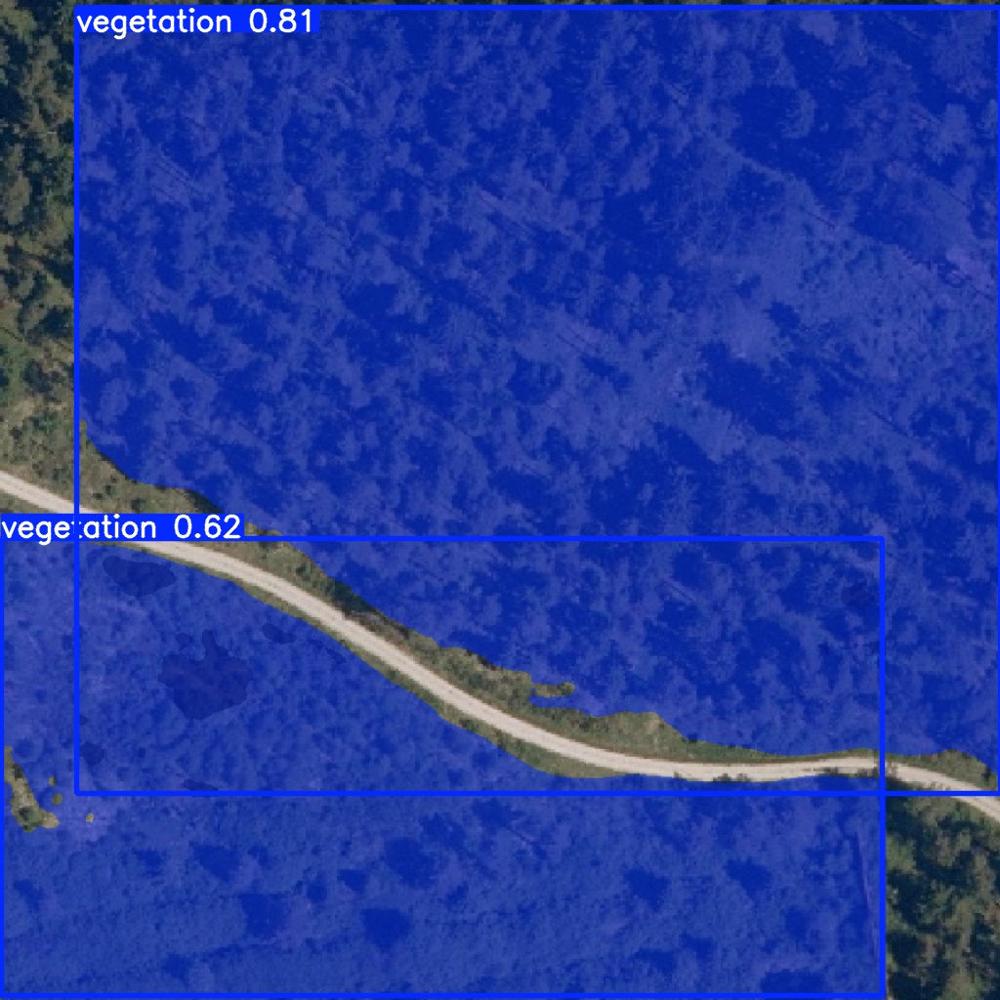

In [ ]:
# ================================
# 9) PREDICT WITH PYTORCH MODEL
# ================================
from ultralytics import YOLO
import cv2
import numpy as np
from pathlib import Path
from IPython.display import display, Image
import random

# Load the best PyTorch model
best_ckpt = run_dir / "weights" / "best.pt"
assert best_ckpt.exists(), f"best.pt not found at {best_ckpt}"

pytorch_model = YOLO(str(best_ckpt))

# Select a sample image for prediction (using one from the validation set)
# Ensure val_imgs and train_imgs are defined - assuming they are from previous cells
sample_img_path = random.choice(val_imgs) if val_imgs else random.choice(train_imgs)
assert Path(sample_img_path).exists(), f"Sample image not found at {sample_img_path}"

print(f"Running prediction on: {sample_img_path} using PyTorch model")

# Perform prediction
results_pytorch = pytorch_model.predict(
    source=sample_img_path,
    imgsz=896,
    conf=0.25,  # Use a confidence threshold
    iou=0.6,    # Use an IoU threshold
    device=device,
    save=True,
    project=str(run_dir / "pytorch_predict_samples"),
    name=".",
    verbose=False
)

# Display the predicted image with masks
# The save directory structure depends on the source type and save settings
# For a single image source with save=True and name='.', the output is usually in project/filename
predicted_image_dir = run_dir / "pytorch_predict_samples" / Path(sample_img_path).parent.name
predicted_image_path = predicted_image_dir / Path(sample_img_path).name


if predicted_image_path.exists():
    print("\nPrediction with PyTorch model:")
    display(Image(filename=predicted_image_path))
else:
     # If the image is not in the expected subdir, check the root of the project dir
    predicted_image_path_root = run_dir / "pytorch_predict_samples" / Path(sample_img_path).name
    if predicted_image_path_root.exists():
         print("\nPrediction with PyTorch model:")
         display(Image(filename=predicted_image_path_root))
    else:
        print(f"Predicted image not found in expected locations: {predicted_image_path} or {predicted_image_path_root}")

Now that the model has been trained and exported, you can use the exported ONNX or TorchScript models for inference in various deployment environments. The evaluation metrics and plots provide insights into the model's performance on the validation and test sets.

In [ ]:
# ================================
# 10) FINISH TASK
# ================================
print("Task finished: YOLOv8 segmentation model trained, evaluated, and exported.")

Task finished: YOLOv8 segmentation model trained, evaluated, and exported.


In [ ]:
from pathlib import Path
import time

# Find the latest YOLOv8 segmentation run dir (change 'veg_yolov8m_seg' if you used a different run name)
runs_root = Path("runs/segment")
candidates = sorted([p for p in runs_root.glob("*") if p.is_dir()], key=lambda p: p.stat().st_mtime, reverse=True)
assert candidates, "No segmentation runs found under runs/segment/"
run_dir = candidates[0]
print("Using run_dir:", run_dir)

Using run_dir: runs/segment/val


In [ ]:
from ultralytics import YOLO
import torch, json

device = "0" if torch.cuda.is_available() else "cpu"

# Find the latest YOLOv8 segmentation run dir (change 'veg_yolov8m_seg' if you used a different run name)
runs_root = Path("runs")
candidates = sorted([p for p in runs_root.rglob("veg_yolov8m_seg") if p.is_dir()], key=lambda p: p.stat().st_mtime, reverse=True)
assert candidates, "No segmentation runs found with name 'veg_yolov8m_seg'"
run_dir = candidates[0]
print("Using run_dir:", run_dir)

best_ckpt = run_dir / "weights" / "best.pt"
assert best_ckpt.exists(), f"best.pt not found at {best_ckpt}"

model = YOLO(str(best_ckpt))

print("— VAL metrics —")
val_res = model.val(data=DATA_YAML, imgsz=896, split="val", device=device, verbose=False, plots=True)
print(val_res.results_dict)  # key metrics in a dict

# If you have a test split in your YAML, also eval on TEST:
print("\n— TEST metrics —")
try:
    test_res = model.val(data=DATA_YAML, imgsz=896, split="test", device=device, verbose=False, plots=True)
    print(test_res.results_dict)
except Exception as e:
    print("No test split or eval failed:", e)

Using run_dir: runs/veg_yolov8m_seg
— VAL metrics —
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs


val: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/valid/labels.cache... 83 images, 10 backgrounds, 0 corrupt: 100%|██████████| 83/83 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


                   all         83        205      0.719      0.595      0.652      0.387      0.731        0.6      0.658      0.342
Speed: 15.3ms preprocess, 22.7ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to runs/segment/val4
{'metrics/precision(B)': np.float64(0.7191390691789251), 'metrics/recall(B)': np.float64(0.5951219512195122), 'metrics/mAP50(B)': np.float64(0.651710504094815), 'metrics/mAP50-95(B)': np.float64(0.3867774980930605), 'metrics/precision(M)': np.float64(0.7311036540917214), 'metrics/recall(M)': np.float64(0.6), 'metrics/mAP50(M)': np.float64(0.6577911164365003), 'metrics/mAP50-95(M)': np.float64(0.34245569629463984), 'fitness': np.float64(0.7872600370020619)}

— TEST metrics —
Ultralytics 8.3.34 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/drive/MyDrive/vegetation segmentation.v4i.yolov8/test/labels.cache... 40 images, 5 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.53s/it]


                   all         40         99      0.565      0.596      0.592      0.302      0.604      0.626      0.615      0.302
Speed: 17.8ms preprocess, 24.2ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/segment/val5
{'metrics/precision(B)': np.float64(0.565374145074386), 'metrics/recall(B)': np.float64(0.5959595959595959), 'metrics/mAP50(B)': np.float64(0.5916817677435879), 'metrics/mAP50-95(B)': np.float64(0.3024149841489307), 'metrics/precision(M)': np.float64(0.6039685225431309), 'metrics/recall(M)': np.float64(0.6262626262626263), 'metrics/mAP50(M)': np.float64(0.6148845090625209), 'metrics/mAP50-95(M)': np.float64(0.30164140181885746), 'fitness': np.float64(0.6643073750516203)}


In [ ]:
from IPython.display import display
for plot in ["results.png", "PR_curve.png", "F1_curve.png", "P_curve.png", "R_curve.png", "confusion_matrix.png"]:
    p = run_dir / plot
    if p.exists():
        display(p)
    else:
        print("Missing plot:", p.name)

PosixPath('runs/veg_yolov8m_seg/results.png')

Missing plot: PR_curve.png
Missing plot: F1_curve.png
Missing plot: P_curve.png
Missing plot: R_curve.png


PosixPath('runs/veg_yolov8m_seg/confusion_matrix.png')

,epoch,time,train/box_loss,train/seg_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),...,metrics/recall(M),metrics/mAP50(M),metrics/mAP50-95(M),val/box_loss,val/seg_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
78,79,4009.11,0.60010,1.28193,1.06396,1.07201,0.67826,0.56098,0.62851,0.37564,...,0.54634,0.58141,0.31410,1.37058,2.44987,2.68296,1.65151,0.001380,0.001380,0.001380
79,80,4056.00,0.59731,1.24926,1.03108,1.06536,0.61542,0.58049,0.59942,0.35133,...,0.56585,0.56118,0.30207,1.42279,2.26410,2.80231,1.73708,0.001359,0.001359,0.001359
80,81,4103.76,0.59745,1.27095,1.06088,1.07322,0.68177,0.60000,0.62404,0.37361,...,0.56098,0.60297,0.32890,1.34426,2.18430,2.75665,1.65090,0.001338,0.001338,0.001338



--- Final epoch summary (transposed) ---
                               80
epoch                   81.000000
time                  4103.760000
train/box_loss           0.597450
train/seg_loss           1.270950
train/cls_loss           1.060880
train/dfl_loss           1.073220
metrics/precision(B)     0.681770
metrics/recall(B)        0.600000
metrics/mAP50(B)         0.624040
metrics/mAP50-95(B)      0.373610
metrics/precision(M)     0.666140
metrics/recall(M)        0.560980
metrics/mAP50(M)         0.602970
metrics/mAP50-95(M)      0.328900
val/box_loss             1.344260
val/seg_loss             2.184300
val/cls_loss             2.756650
val/dfl_loss             1.650900
lr/pg0                   0.001338
lr/pg1                   0.001338
lr/pg2                   0.001338

--- Key metrics ---
metrics/precision(B): 0.6818
metrics/recall(B): 0.6000
metrics/mAP50(B): 0.6240
metrics/mAP50-95(B): 0.3736
metrics/precision(M): 0.6661
metrics/recall(M): 0.5610
metrics/mAP50(M): 0.6030
m

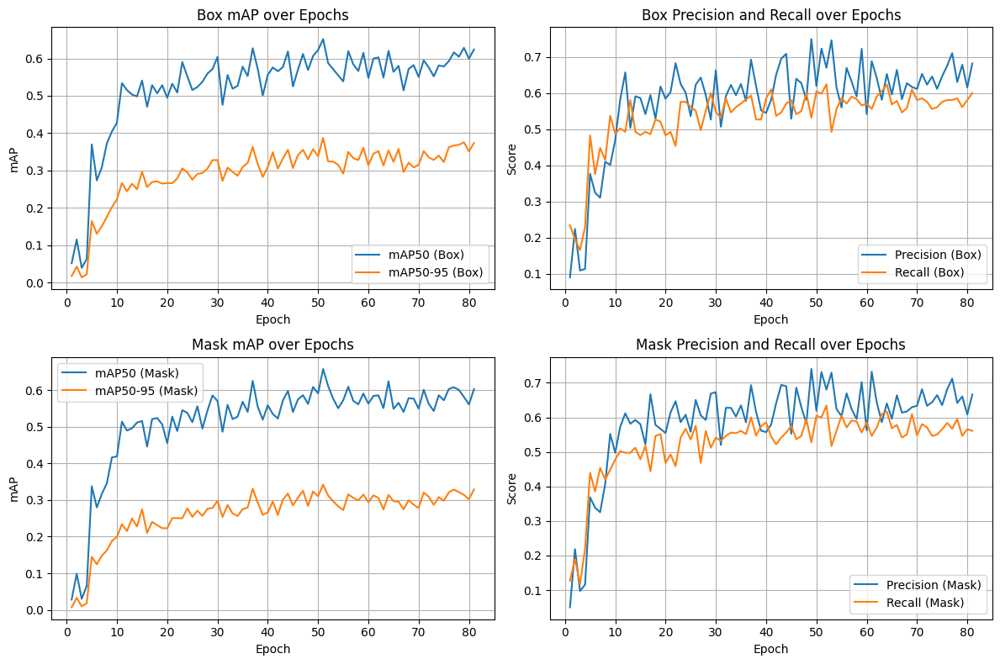

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

csv_path = run_dir / "results.csv"
assert csv_path.exists(), f"results.csv not found at {csv_path}"

df = pd.read_csv(csv_path)

# Display the last few epochs and final summary
display(df.tail(3))  # last 3 epochs
print("\n--- Final epoch summary (transposed) ---")
print(df.tail(1).T)

# Try to print the most important columns if present
wanted_cols = [
    "metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/mAP50-95(B)",  # boxes
    "metrics/precision(M)", "metrics/recall(M)", "metrics/mAP50(M)", "metrics/mAP50-95(M)",  # masks
    "fitness"
]
print("\n--- Key metrics ---")
for c in wanted_cols:
    if c in df.columns:
        print(f"{c}: {df[c].iloc[-1]:.4f}")

# Plotting key metrics
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP50 (Box)')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95 (Box)')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Box mAP over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 2)
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision (Box)')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall (Box)')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.title('Box Precision and Recall over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 3)
plt.plot(df['epoch'], df['metrics/mAP50(M)'], label='mAP50 (Mask)')
plt.plot(df['epoch'], df['metrics/mAP50-95(M)'], label='mAP50-95 (Mask)')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Mask mAP over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 4)
plt.plot(df['epoch'], df['metrics/precision(M)'], label='Precision (Mask)')
plt.plot(df['epoch'], df['metrics/recall(M)'], label='Recall (Mask)')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.title('Mask Precision and Recall over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

Checking for predictions in: /content/runs/veg_yolov8m_seg/pred_on_val6

Sample Predictions:


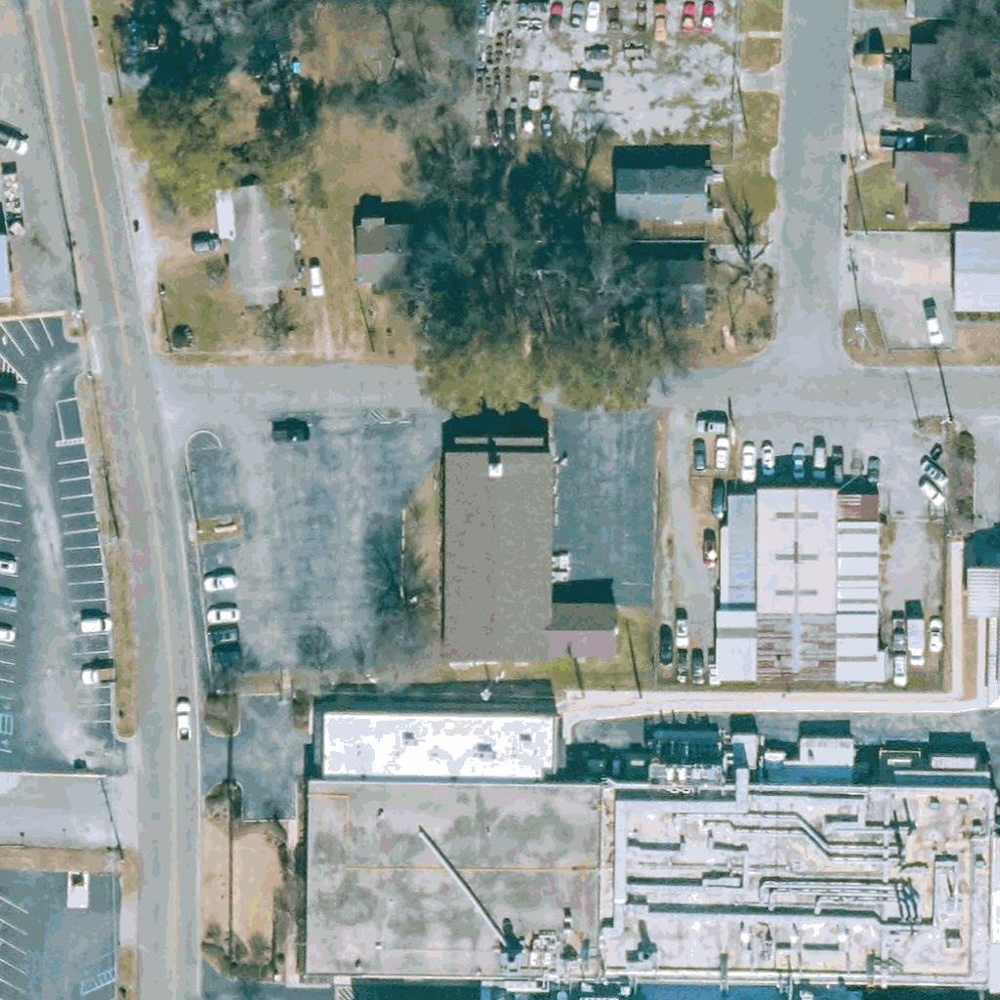

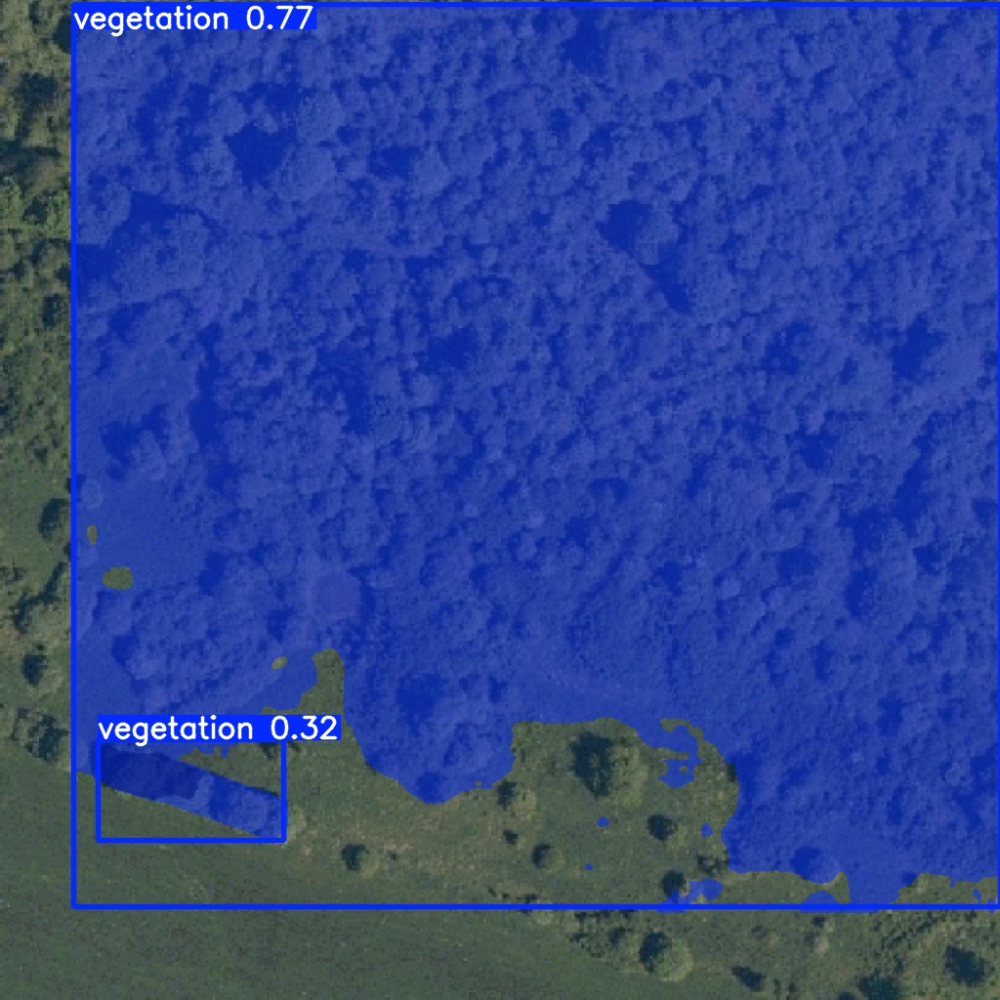

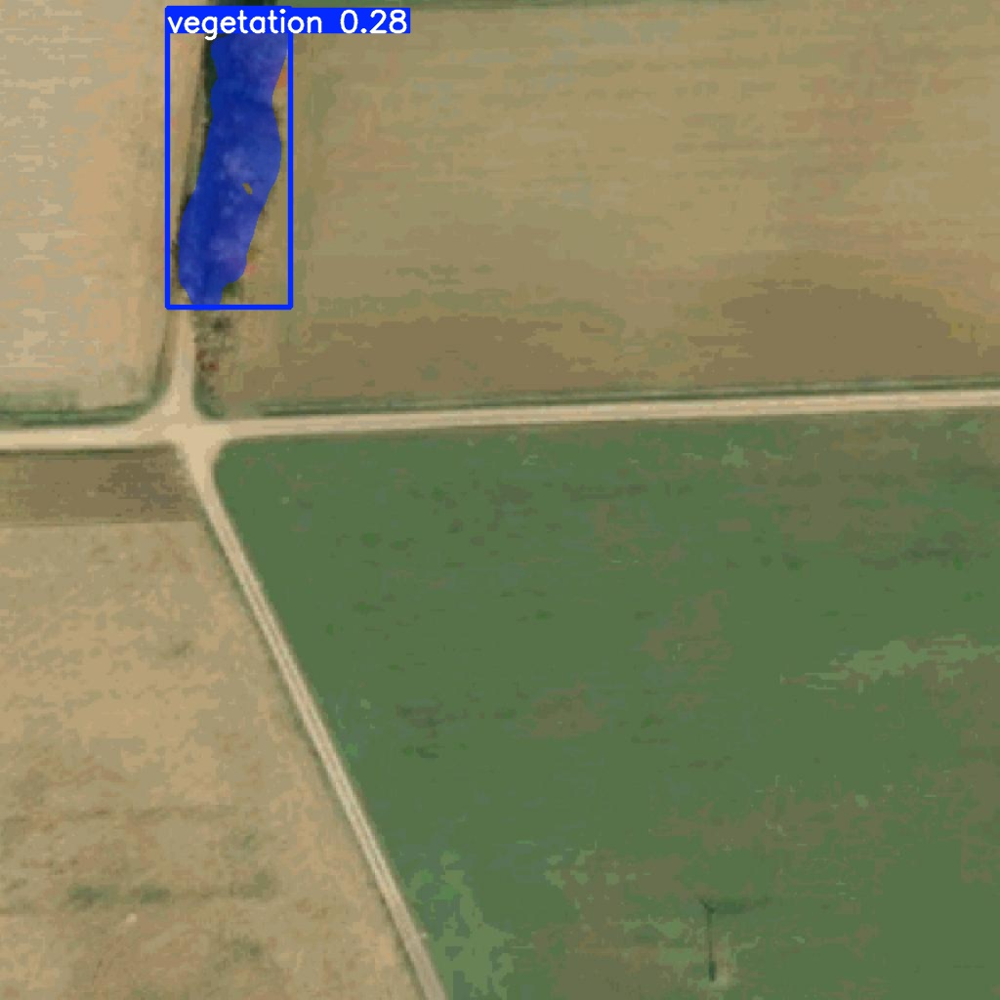

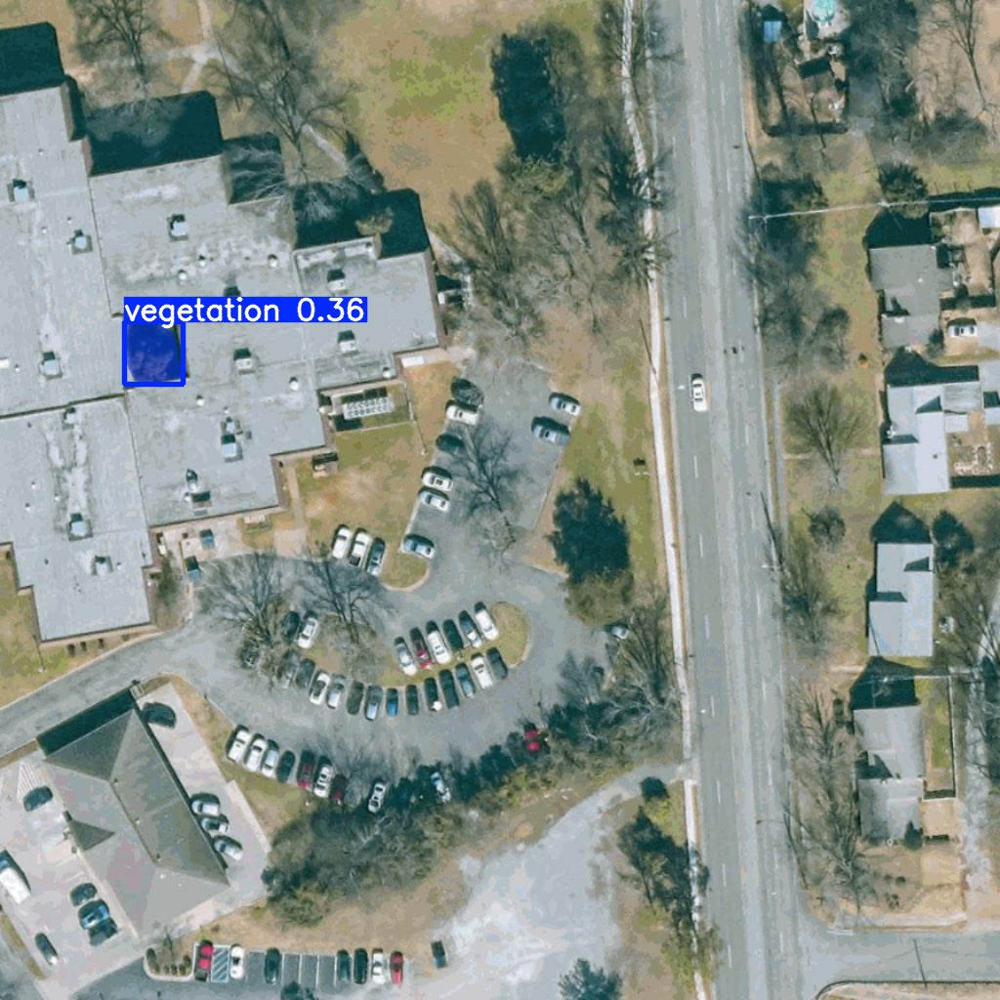

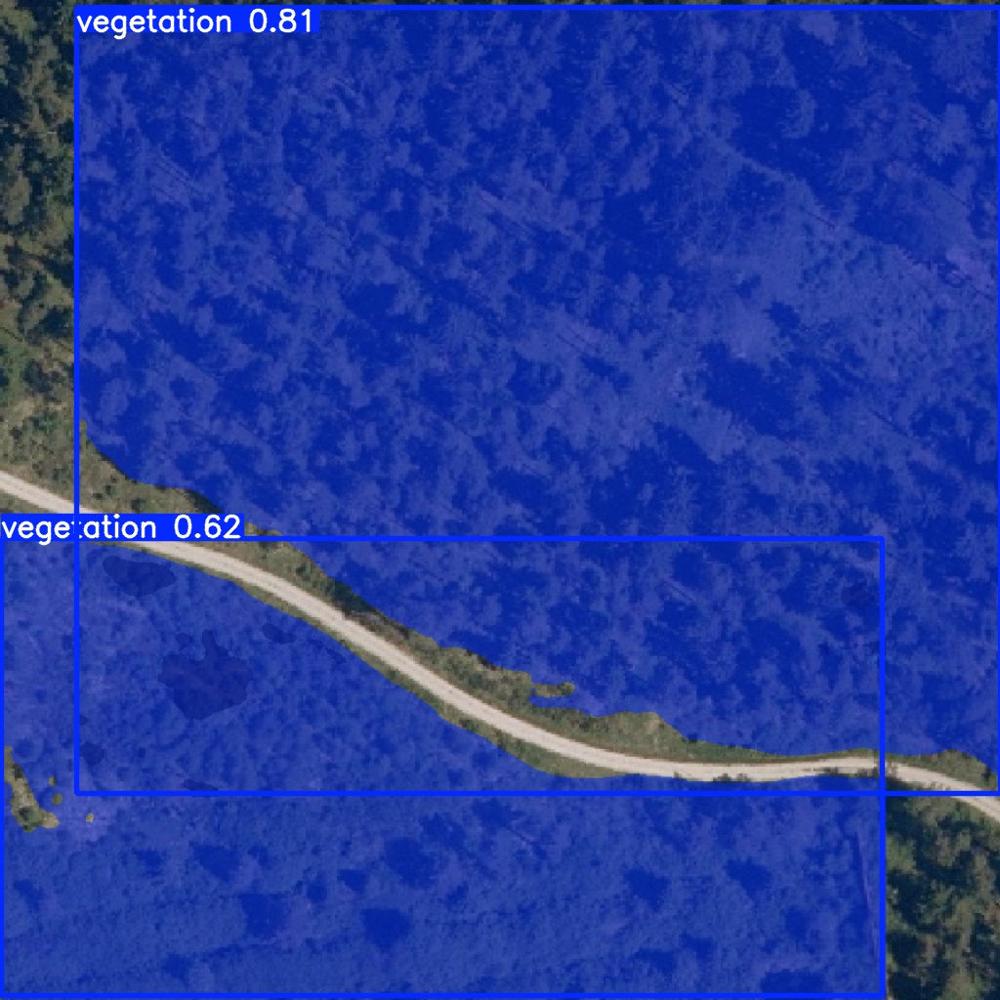

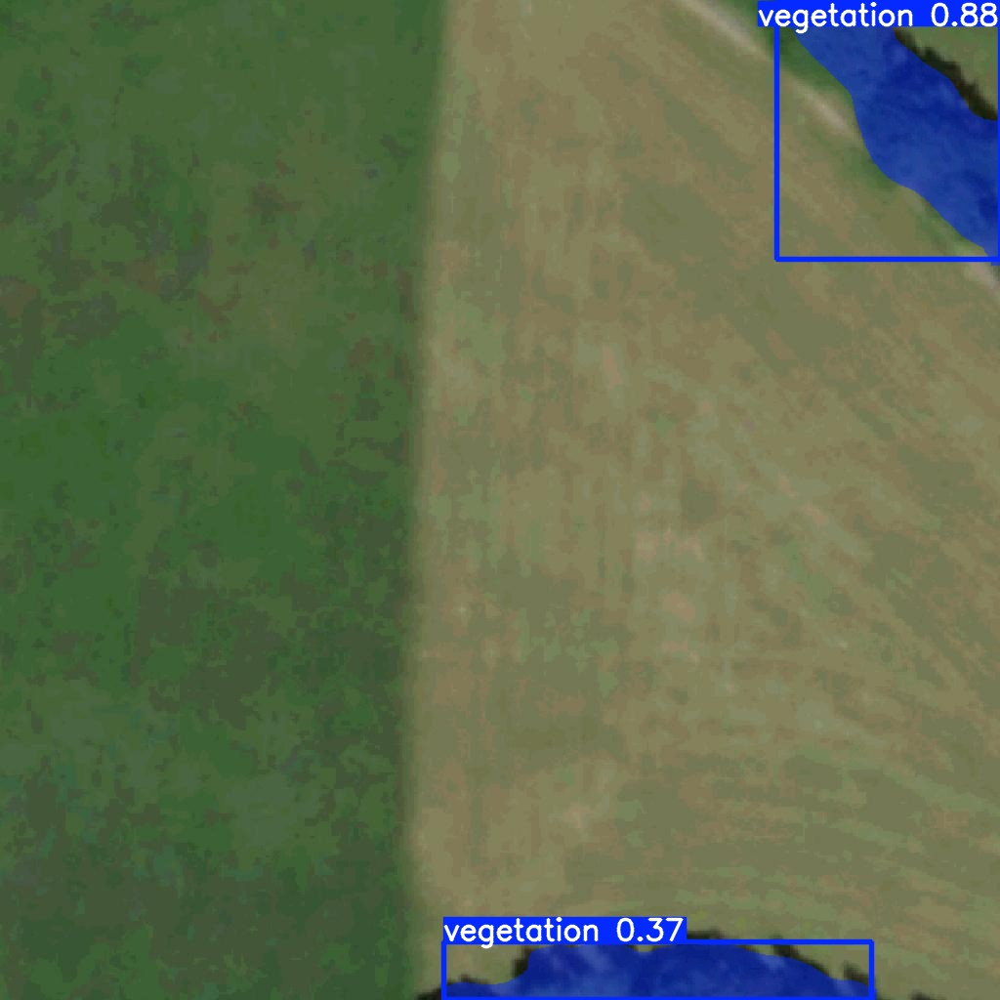

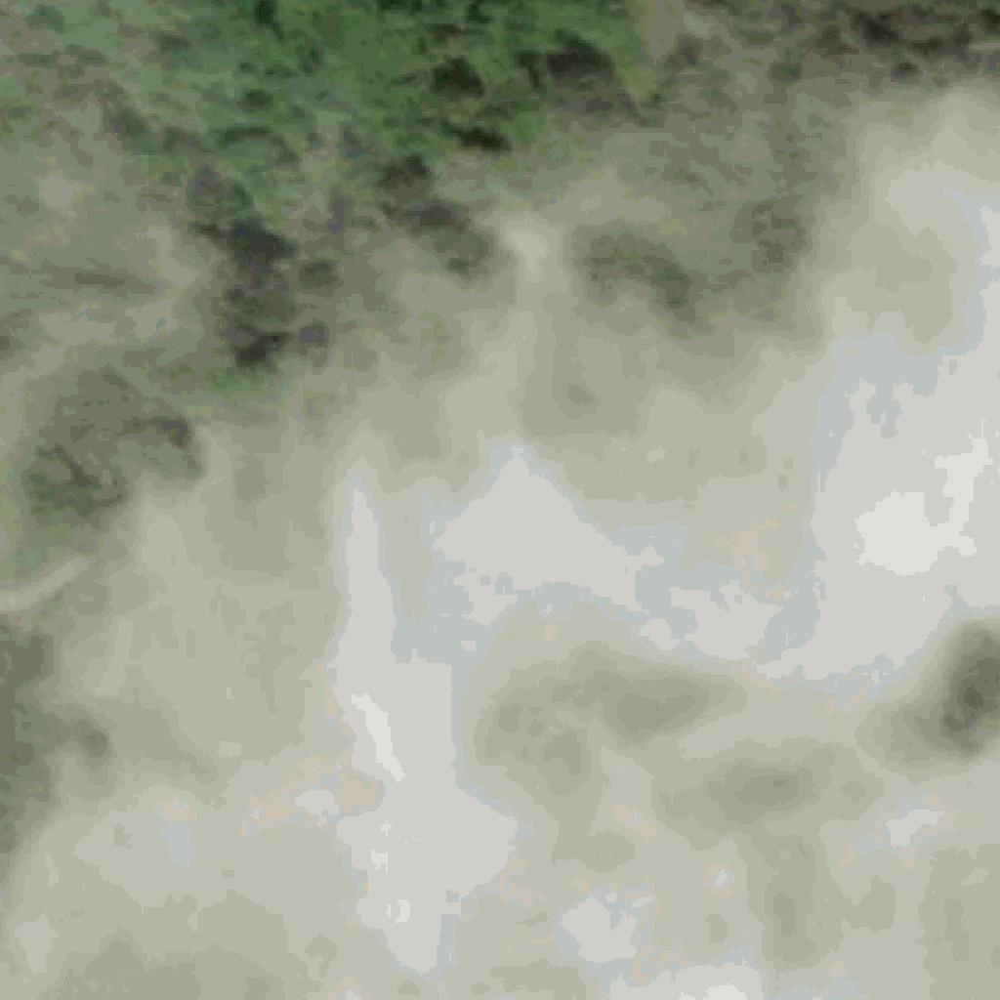

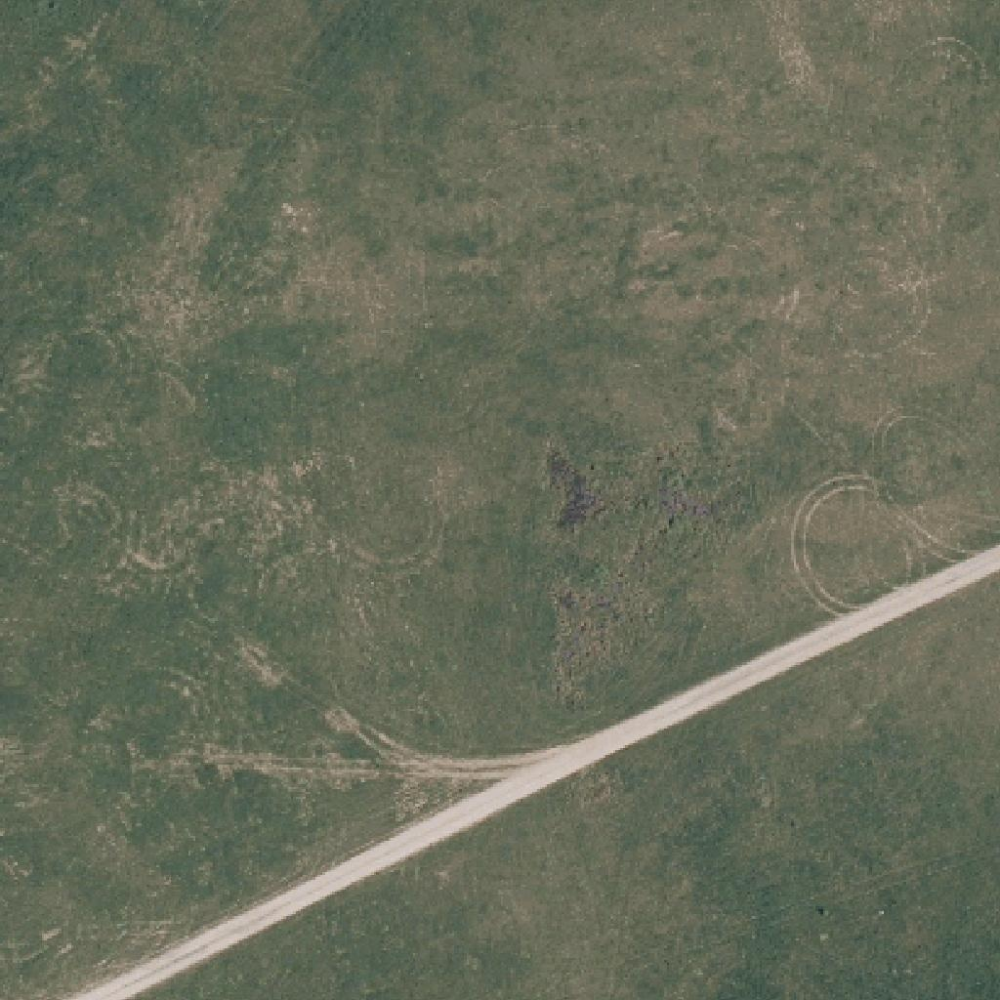

Results saved to runs/veg_yolov8m_seg/pred_on_val6

Prediction process finished. New predictions saved in the default location.


In [ ]:
import glob
from IPython.display import display, Image
import os

val_imgs = glob.glob(str((Path(DATA_YAML).parent / "valid" / "images") / "*"))[:8]

# The directory where the predictions were saved
# Update this path based on the user's feedback
pred_run_dir = Path("/content/runs/veg_yolov8m_seg/pred_on_val6")

if not pred_run_dir.exists():
    print(f"Prediction directory not found: {pred_run_dir}")
else:
    print("Checking for predictions in:", pred_run_dir)

    # Display the predicted images
    predicted_image_paths = sorted(list(pred_run_dir.glob("*.jpg")))[:8]
    print("\nSample Predictions:")
    if predicted_image_paths:
        for img_path in predicted_image_paths:
            display(Image(filename=img_path))
    else:
        print("No .jpg images found in the prediction run directory.")

# Note: The model.predict call below will save new predictions to a new directory
# if you run this cell again. If you want to display those new predictions,
# you'll need to update the 'pred_run_dir' path above accordingly.
results = model.predict(
    source=val_imgs,
    imgsz=896,
    conf=0.25,
    iou=0.6,
    device=device,
    save=True,
    verbose=False # Set verbose to False to reduce output clutter
)
print("\nPrediction process finished. New predictions saved in the default location.")

Contents of /content/runs/segment/val2:
BoxF1_curve.png


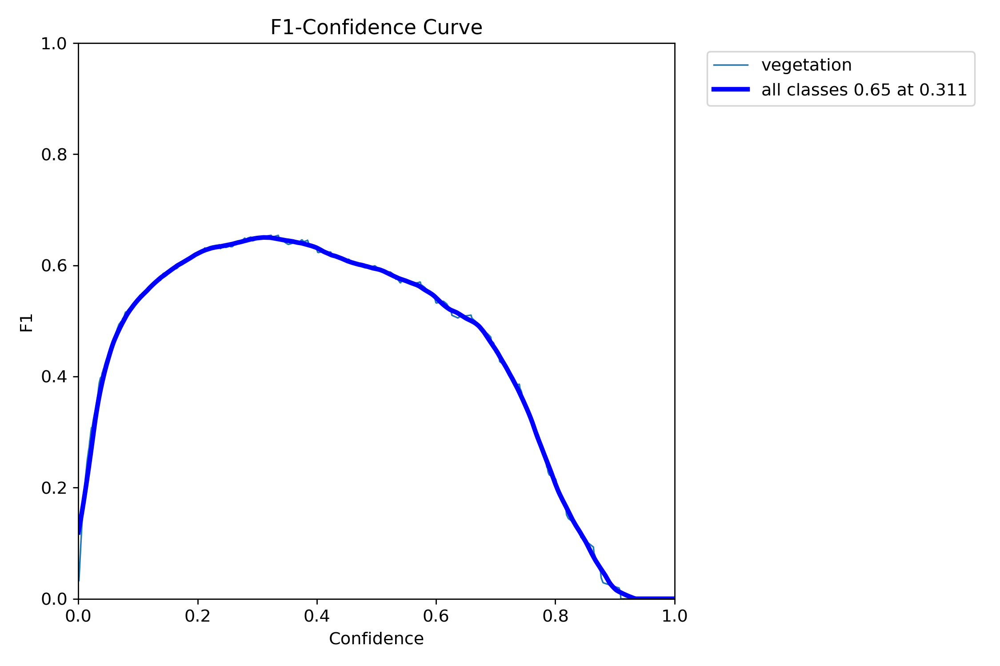

val_batch2_pred.jpg


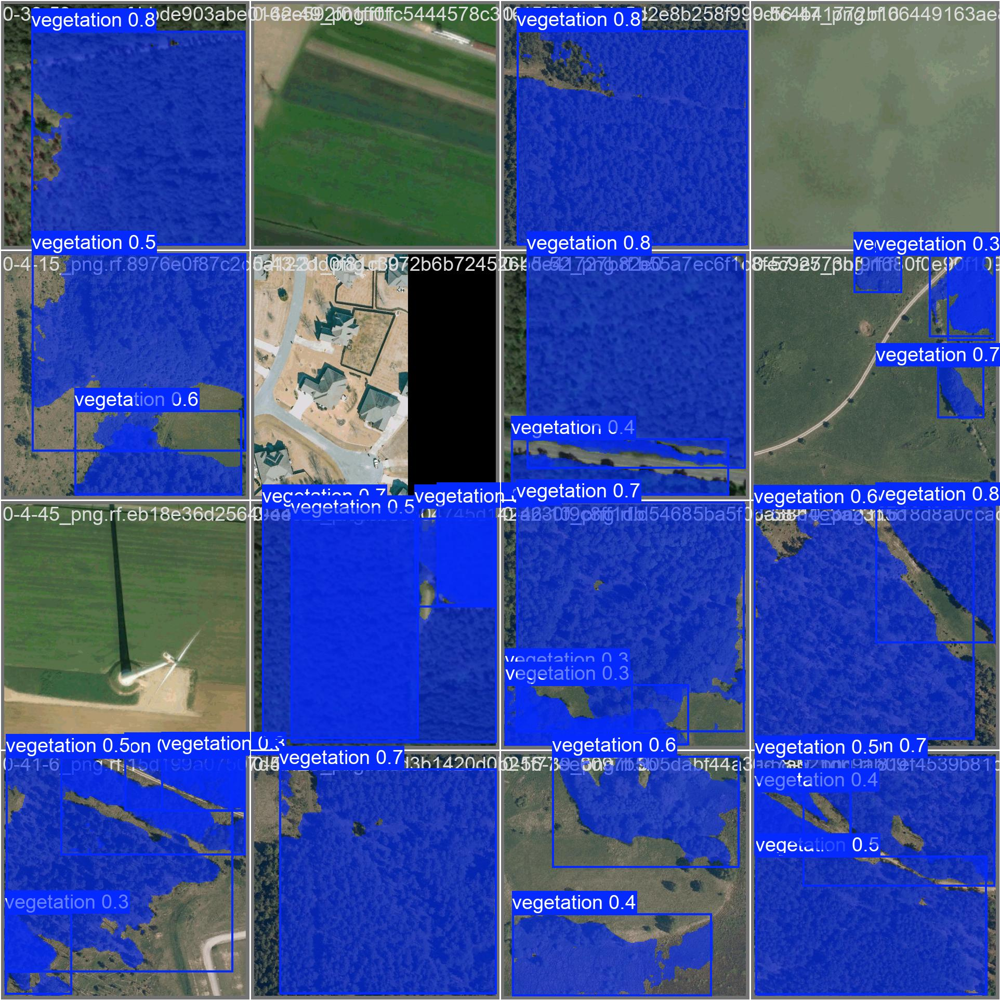

MaskPR_curve.png


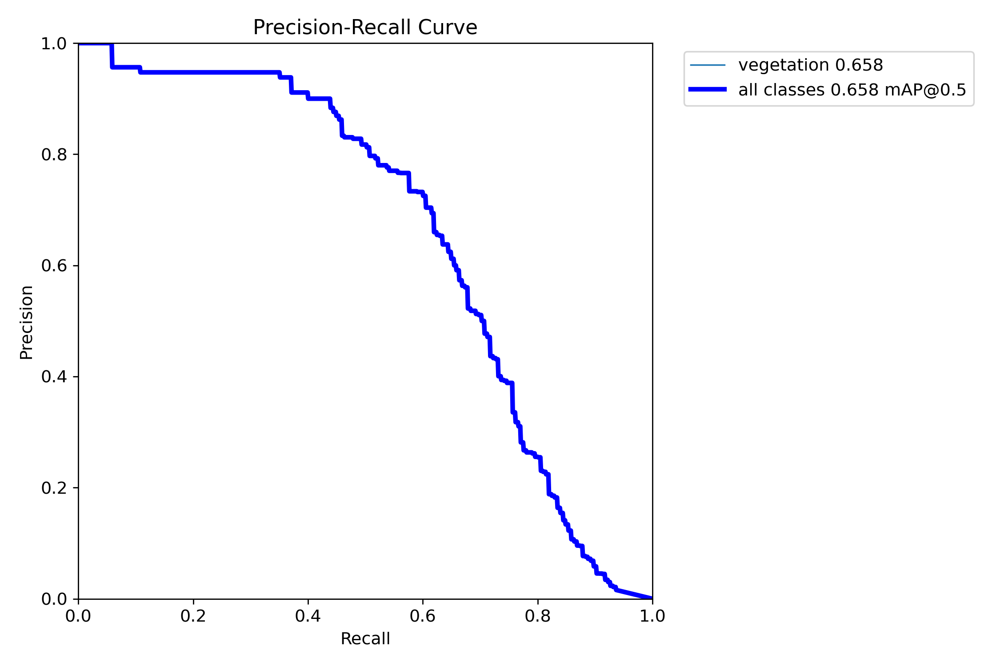

confusion_matrix.png


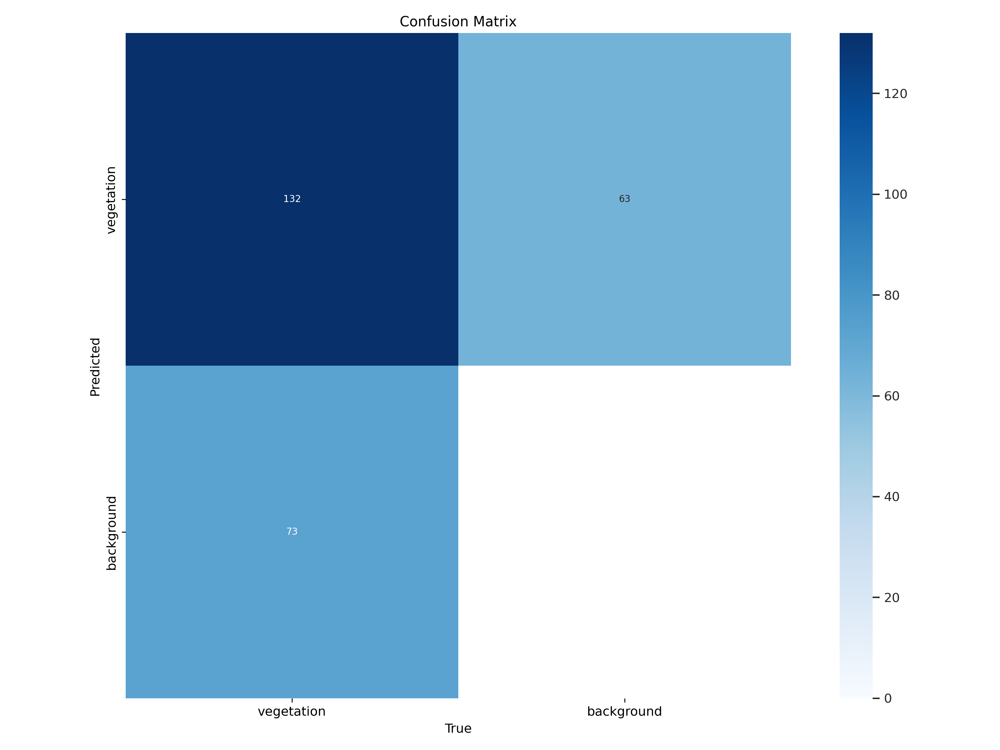

MaskP_curve.png


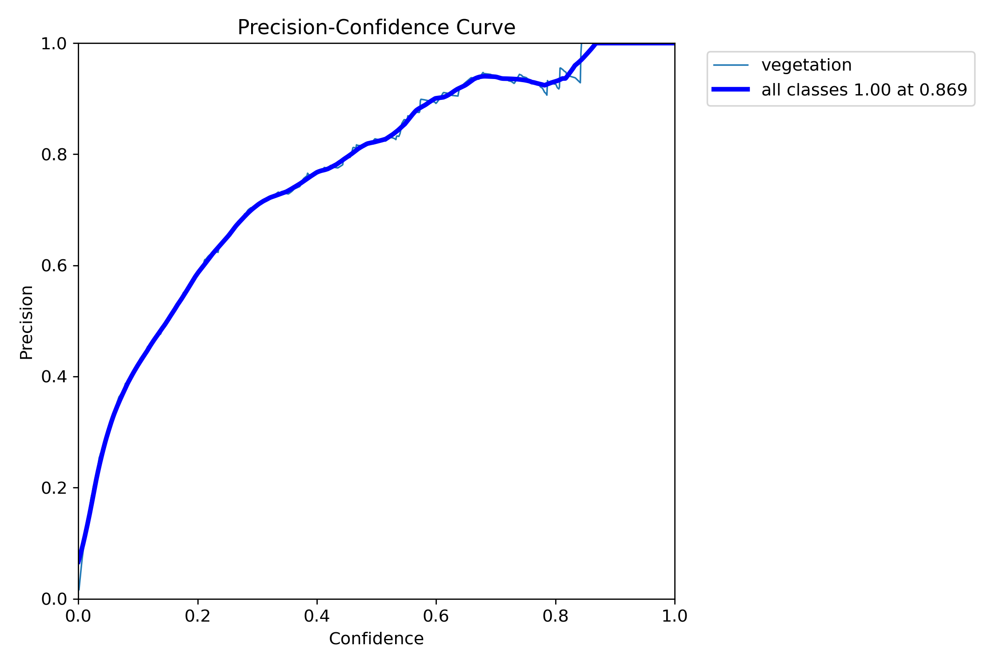

MaskF1_curve.png


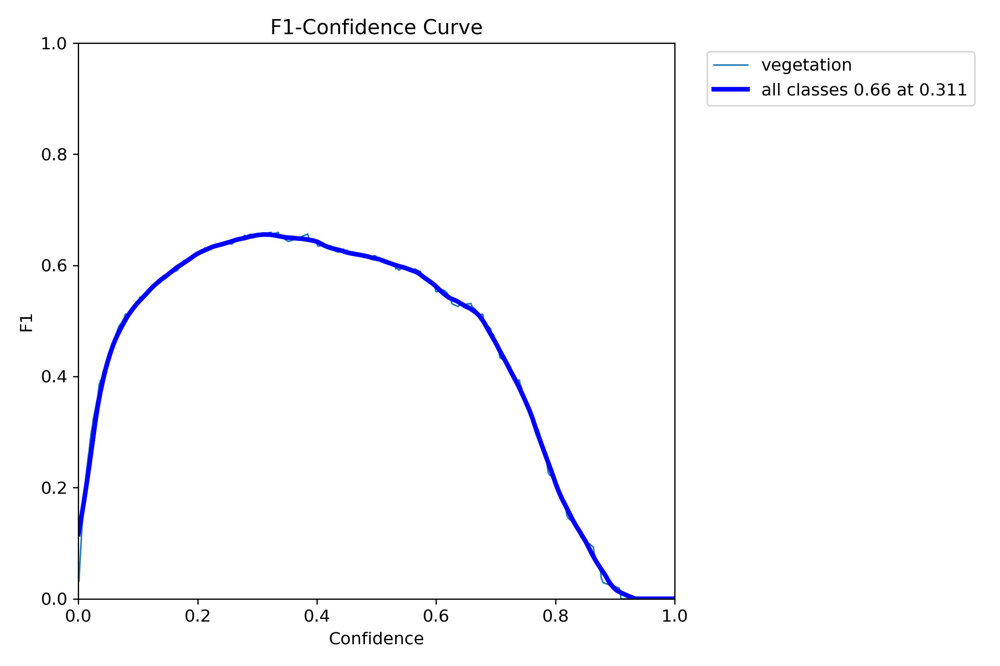

BoxP_curve.png


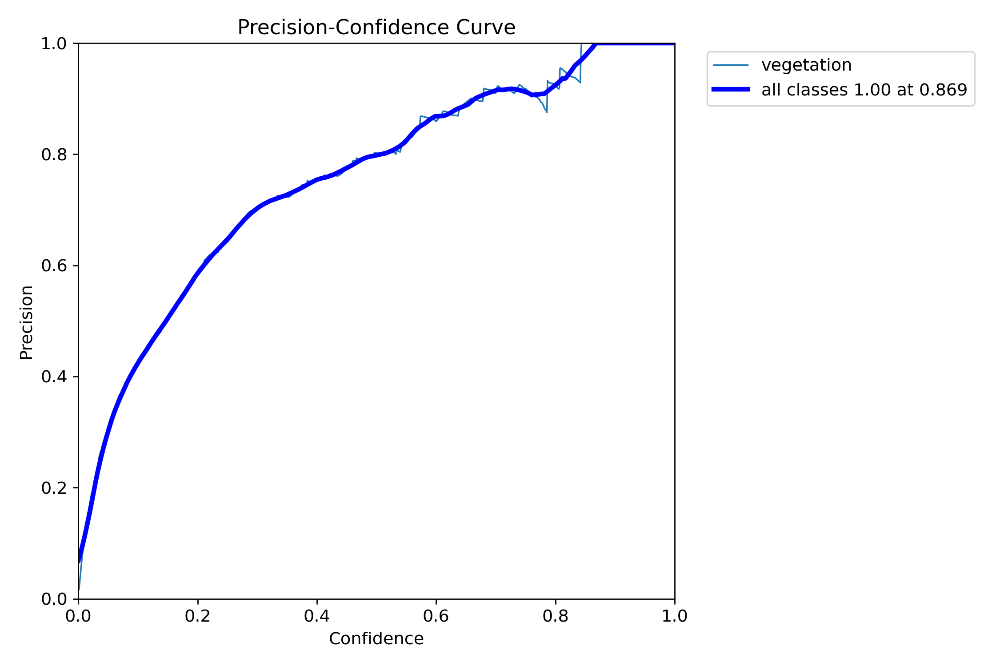

BoxR_curve.png


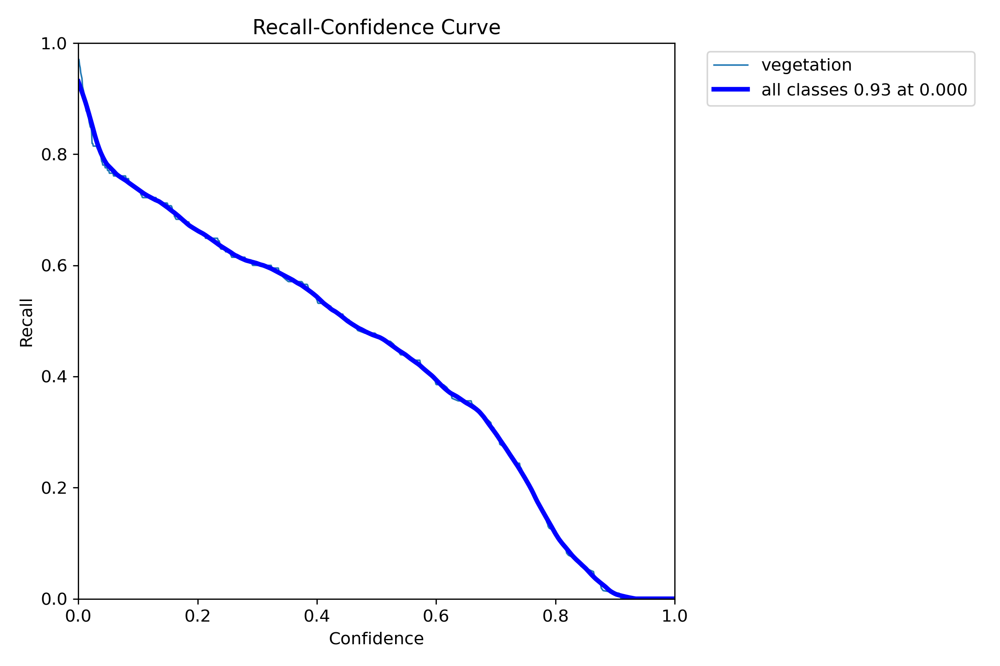

val_batch1_labels.jpg


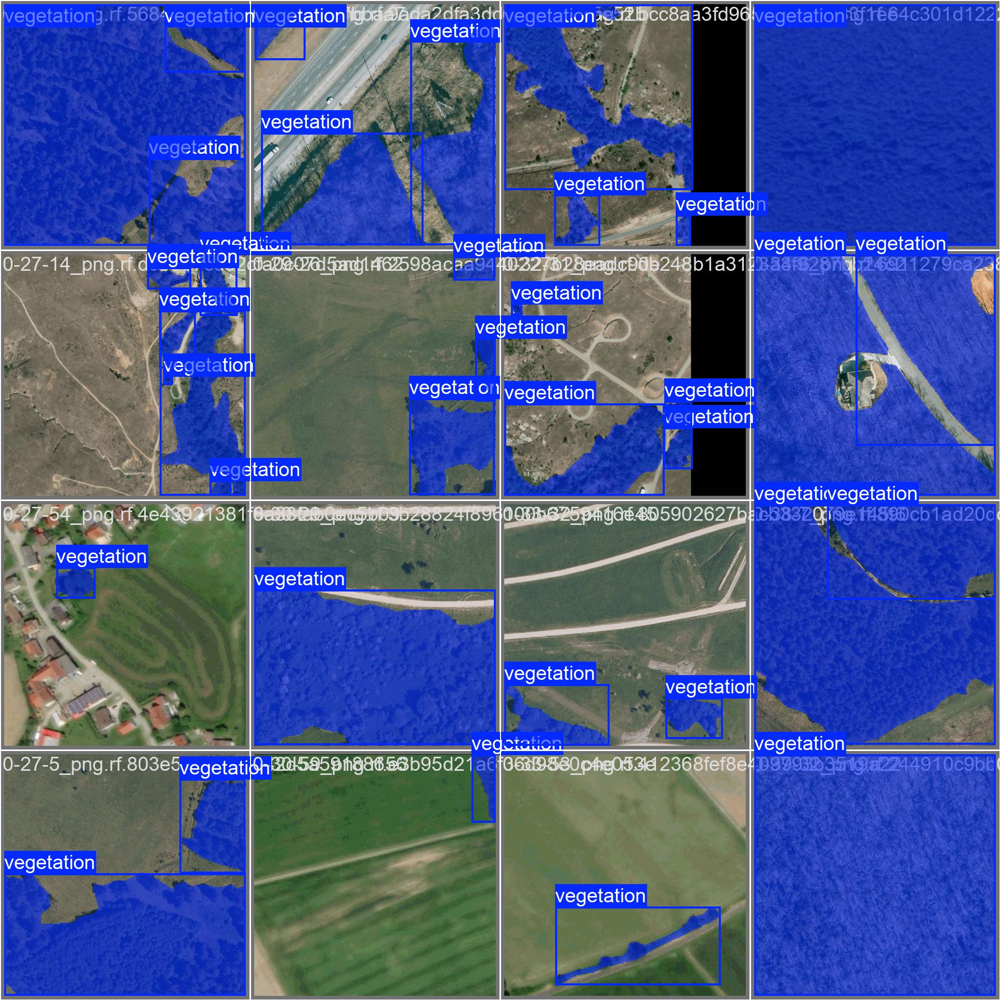

confusion_matrix_normalized.png


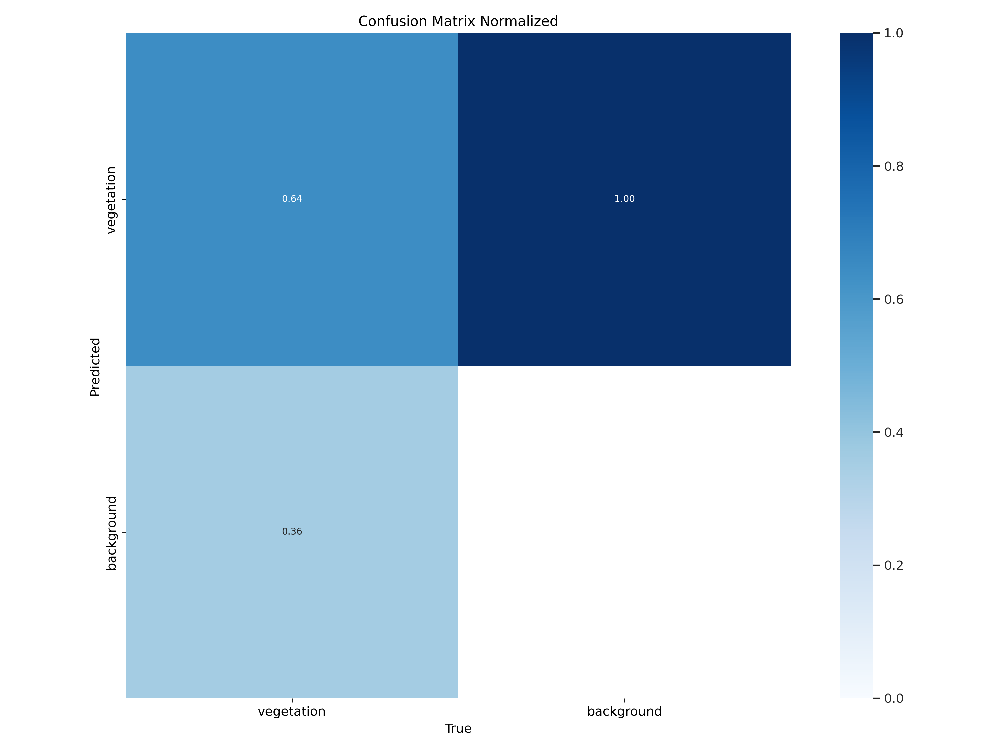

val_batch0_labels.jpg


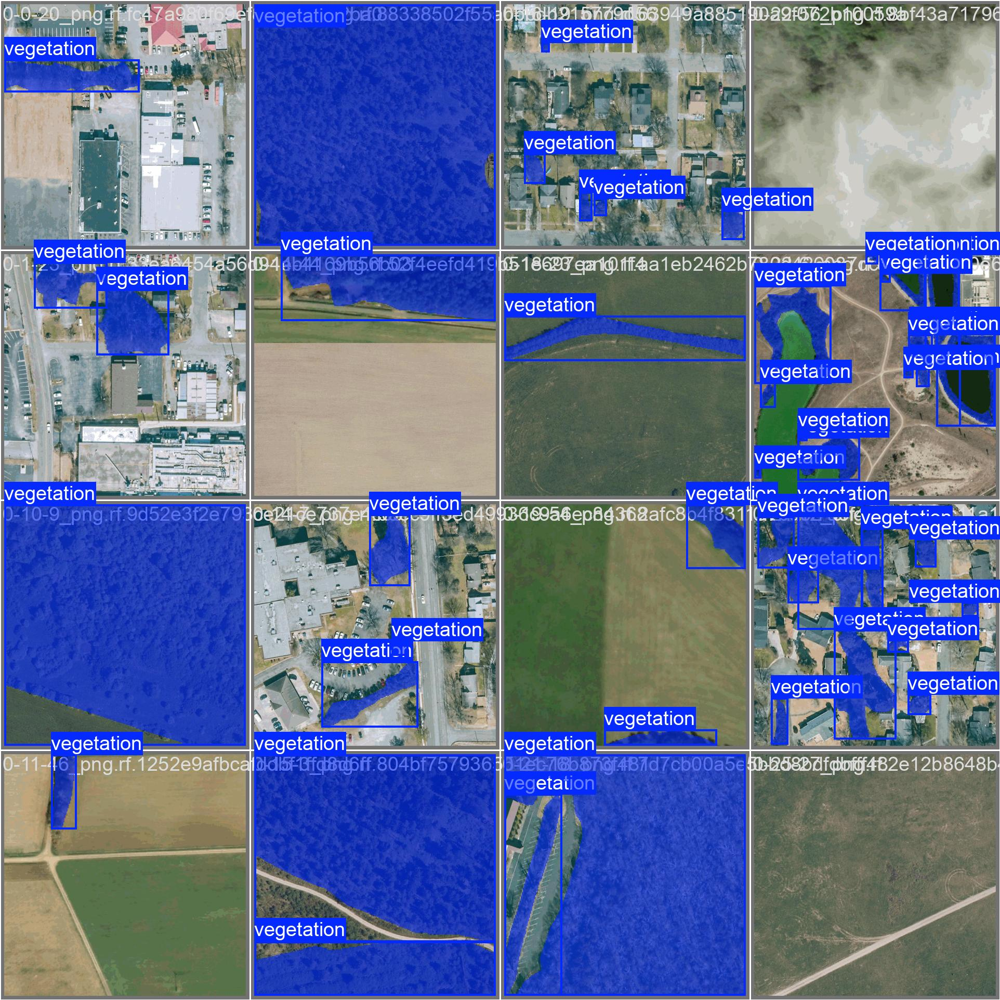

BoxPR_curve.png


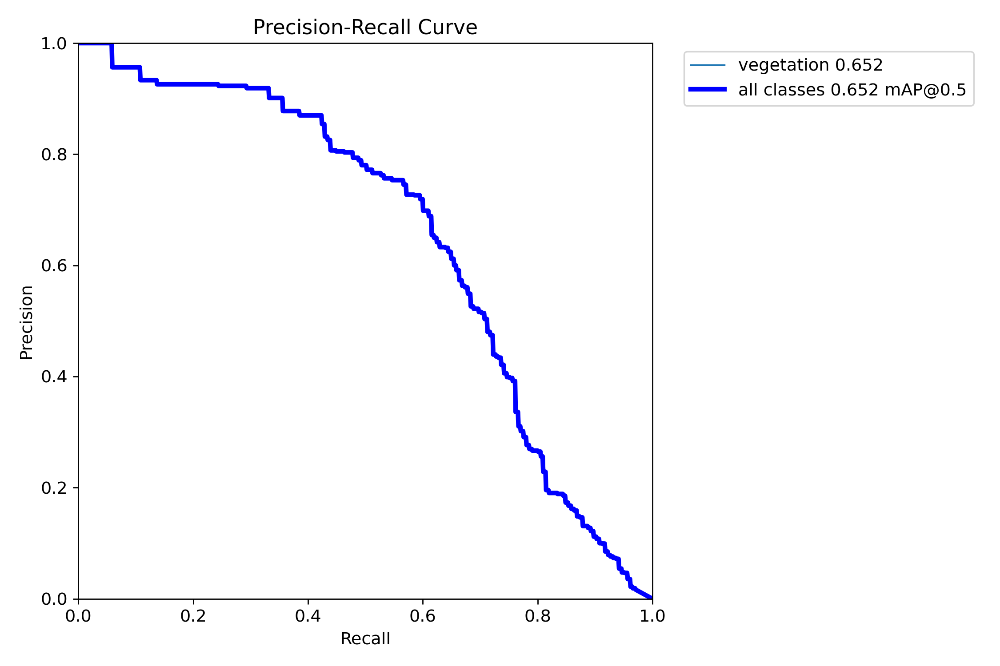

val_batch0_pred.jpg


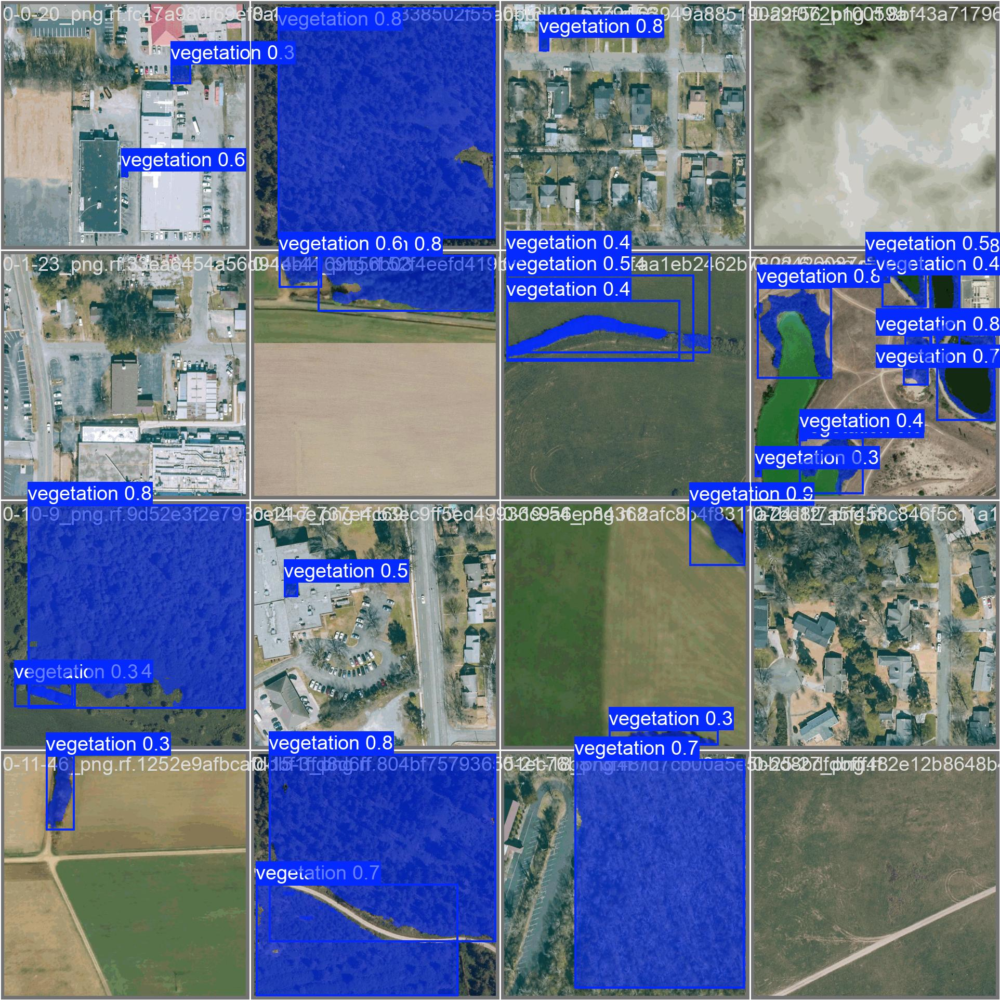

val_batch1_pred.jpg


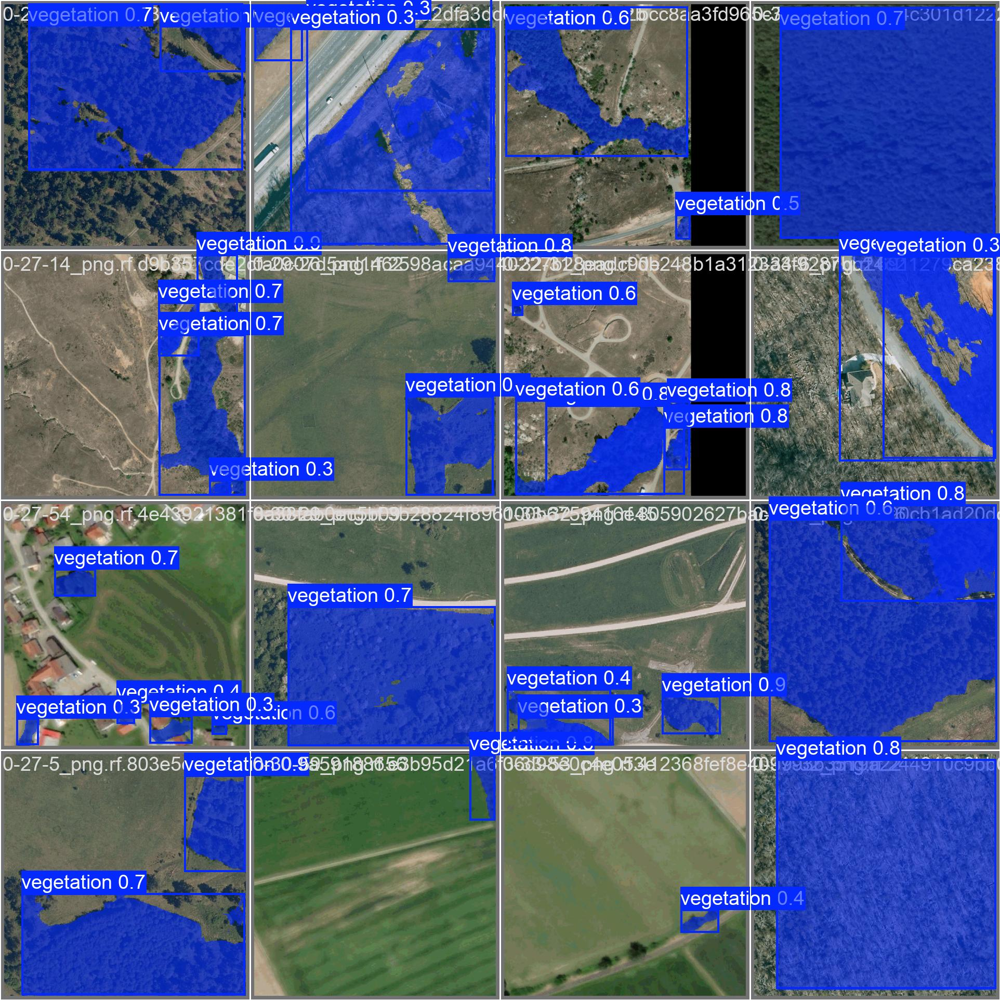

val_batch2_labels.jpg


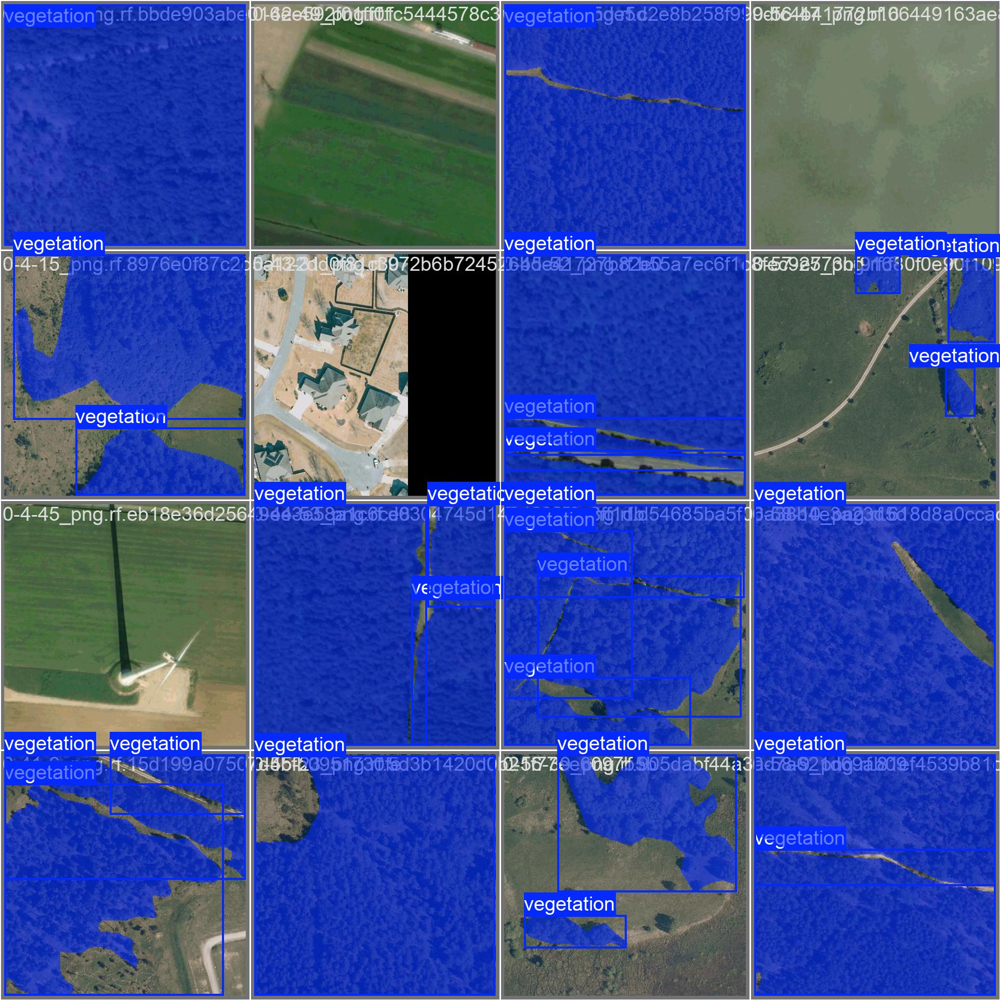

MaskR_curve.png


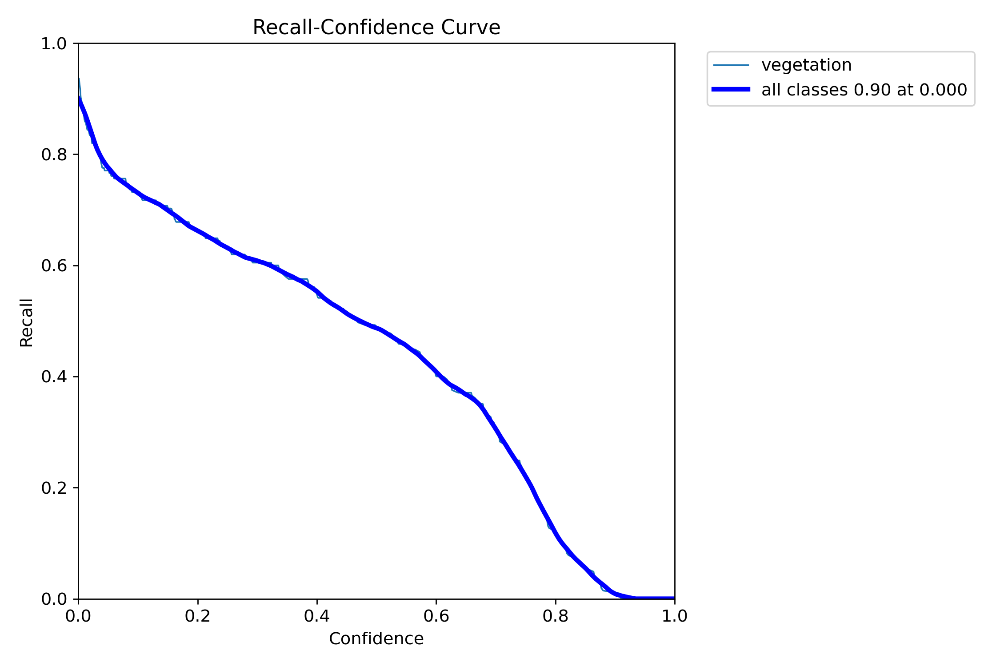

In [ ]:
import os
from IPython.display import display, Image
from pathlib import Path

results_dir = Path("/content/runs/segment/val2")

if not results_dir.exists():
    print(f"Directory not found: {results_dir}")
else:
    print(f"Contents of {results_dir}:")
    for item in os.listdir(results_dir):
        item_path = results_dir / item
        print(item)
        # Display image files
        if item_path.is_file() and item_path.suffix.lower() in ['.jpg', '.jpeg', '.png', '.bmp']:
            display(Image(filename=item_path))

# Task
Deploy the exported model with a frontend.

## Choose a deployment strategy

### Subtask:
Decide on the best way to deploy your model (e.g., Flask/Django backend, TensorFlow Serving, TorchServe, cloud functions).


**Reasoning**:
Based on the instructions, the best approach for demonstrating the model's functionality is to build a simple web API using Flask or FastAPI due to their balance of flexibility and ease of implementation. I will choose Flask for simplicity in this demonstration. The next step is to set up the basic Flask application structure and load the exported PyTorch model.



In [ ]:
from flask import Flask, request, jsonify
from ultralytics import YOLO
import torch
import numpy as np
import cv2
import base64
from PIL import Image
import io

# Load the best PyTorch model
# Assuming run_dir is accessible from previous cells or define it here
# Example: run_dir = Path("runs/veg_yolov8m_seg")
# Need to ensure run_dir is correctly pointing to the trained model directory
# For demonstration, let's assume run_dir is correctly set from previous cells.
best_ckpt = run_dir / "weights" / "best.pt"
if not best_ckpt.exists():
    # If run_dir is not available or correct, try to find the latest run
    runs_root = Path("runs")
    candidates = sorted([p for p in runs_root.rglob("veg_yolov8m_seg") if p.is_dir()], key=lambda p: p.stat().st_mtime, reverse=True)
    if candidates:
        run_dir = candidates[0]
        best_ckpt = run_dir / "weights" / "best.pt"
    else:
        raise FileNotFoundError("Could not find the model weights.")

model = YOLO(str(best_ckpt))
device = "0" if torch.cuda.is_available() else "cpu"
model.to(device) # Move model to the correct device

app = Flask(__name__)

@app.route('/predict', methods=['POST'])
def predict():
    if 'image' not in request.files:
        return jsonify({'error': 'No image file provided'}), 400

    file = request.files['image']
    img_bytes = file.read()
    img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
    img_np = np.array(img) # Convert PIL image to numpy array

    # Perform inference
    # model.predict expects source to be a file path, PIL Image, or numpy array
    results = model.predict(
        source=img_np,
        imgsz=896,
        conf=0.25,
        iou=0.6,
        device=device,
        save=False, # Don't save to disk
        verbose=False
    )

    # Process results - Extract masks and boxes
    segmentation_results = []
    for r in results:
        if r.masks is not None:
            masks = r.masks.data.cpu().numpy() # Get masks as numpy arrays
            boxes = r.boxes.xyxy.cpu().numpy() # Get bounding boxes
            confidences = r.boxes.conf.cpu().numpy() # Get confidences
            classes = r.boxes.cls.cpu().numpy() # Get classes

            for i in range(len(masks)):
                 # Convert mask to polygon coordinates (example, simplifies for demonstration)
                 # A more robust approach might involve contour finding with OpenCV
                mask = masks[i]
                # Simple thresholding to get binary mask
                binary_mask = (mask > 0.5).astype(np.uint8) * 255
                # Find contours - need to install opencv-python-headless for server environments
                # Or ensure opencv-python is installed if running locally with display capabilities
                contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

                polygons = []
                for contour in contours:
                    # Flatten contour points and normalize (if needed, but model output is normalized)
                    # Here we will return pixel coordinates for simplicity
                    polygon = contour.flatten().tolist()
                    polygons.append(polygon)


                segmentation_results.append({
                    'box': boxes[i].tolist(),
                    'confidence': float(confidences[i]),
                    'class': int(classes[i]),
                    'mask_polygon': polygons # Store polygon coordinates
                })


    return jsonify(segmentation_results)

if __name__ == '__main__':
    # This is for running locally. For deployment, use a production server like Gunicorn or uWSGI.
    # app.run(debug=True, host='0.0.0.0') # Use host='0.0.0.0' to make it accessible externally
    print("Flask app configured. To run, execute this script directly or use a production server.")
